# Imports and Data

In [1]:
import numpy as np
import pandas as pd
import datetime as dt
import os
import matplotlib.pyplot as plt
import phonecalls as pc
import scipy.stats as stats
import scipy.interpolate as interpol
import time
import copy
import math
import pickle


plt.rcParams['figure.figsize'] = (20, 10)
markers = ['o', 'v', 's', 'P', '*', 'X', 'd', 'x', 'D', '2', '+']
colors = ['#348ABD', '#A60628', '#7A68A6', '#467821', '#D55E00', '#CC79A7', '#56B4E9', '#009E73', '#F0E442', '#0072B2']

with open('unfiltered.pkl', 'rb') as handle:
    unfiltered = pickle.load(handle)
handle.close()

with open('filtered.pkl', 'rb') as handle:
    filtered = pickle.load(handle)
handle.close()

with open('filterednc.pkl', 'rb') as handle:
    filterednc = pickle.load(handle)
handle.close()

import statsmodels.api as sm

globalt0 = dt.datetime.now()

# Edit main paper results

There is an inconsistency between the reported results and the results of the current version of the paper. Since lifetimes for each alter were limited to $\mathcal{T}$, whenever an alter reaches lifetime $\ell >= \mathcal{T}$, its lifetime is truncated to $\mathcal{T}$. This generates an over representation of alters with $\ell = \mathcal{T}$. The fix is simple: I will only consider alters with $\ell < \mathcal{T}$.

In [2]:
calls = {}
for c in ['uk', 'uk2', 'mit']:
#     df = unfiltered[c].copy(deep=True)
#     df['ea'] = list(zip(df['ego'], df['alter']))
#     ncalls = df.groupby('ea')[['time']].count()
#     ncalls = ncalls.loc[ncalls['time'] > 2]
#     df = df[df['ea'].isin(ncalls.index)]
#     df = df.drop(columns=['ea'])
    calls[c] = pc.limit_calls(unfiltered[c], 231)

## Fig 2

In [3]:
alldff = {}
for c in calls.keys():
    alldff[c] = pc.get_f(calls[c], 'all', 15, 67)
    
with open('../itdata/mtl_fig2.pickle', 'rb') as handle:
    alldff['it'] = pickle.load(handle)
    handle.close()

In [4]:
lives = {}
for c in calls.keys():
    lives[c] = pc.lives_dictionary(calls[c])
    
with open('../itdata/mtl_lives.pickle', 'rb') as handle:
    lives['it'] = pickle.load(handle)
    handle.close()

In [5]:
limits = {}
limits[0] = (0, 50)
limits[1] = (100, 150)
limits[2] = (180, 230)

stablec = {}
for c in ['uk', 'uk2', 'it', 'mit']:
    stablec[c] = {}
    for i in limits.keys():
        stablec[c][i] = pc.get_avgfa(alldff[c], lives[c], limits[i][0], limits[i][1])

In [6]:
lines = {}
lines[0] = (1, 3)
lines[1] = (1, 8)
lines[2] = (2, 12)
dashed = {}

for c in ['uk', 'uk2', 'it', 'mit']:
    dashed[c] = {}
    print(f'======================={c}=====================')
    for l in stablec[c].keys():
        df = stablec[c][l].loc[(stablec[c][l].index >= lines[l][0]) & (stablec[c][l].index <= lines[l][1])]
        h = np.mean(df['f'])
        dashed[c][l] = ([lines[l][0], lines[l][1]], [h, h])
        print(f'\draw[dashed, {["charmander", "squirtle", "ekans"][int(l)]}, ultra thick] (axis cs: {lines[l][0]}, {h}) -- (axis cs: {lines[l][1]}, {h});')

=======================uk=====================
\draw[dashed, charmander, ultra thick] (axis cs: 1, 0.12173505564302951) -- (axis cs: 3, 0.12173505564302951);
\draw[dashed, squirtle, ultra thick] (axis cs: 1, 1.376343831708415) -- (axis cs: 8, 1.376343831708415);
\draw[dashed, ekans, ultra thick] (axis cs: 2, 2.6483105206643036) -- (axis cs: 12, 2.6483105206643036);
=======================uk2=====================
\draw[dashed, charmander, ultra thick] (axis cs: 1, 0.13727604116099731) -- (axis cs: 3, 0.13727604116099731);
\draw[dashed, squirtle, ultra thick] (axis cs: 1, 2.0533128578872626) -- (axis cs: 8, 2.0533128578872626);
\draw[dashed, ekans, ultra thick] (axis cs: 2, 2.761516451107055) -- (axis cs: 12, 2.761516451107055);
=======================it=====================
\draw[dashed, charmander, ultra thick] (axis cs: 1, 0.06502892718101379) -- (axis cs: 3, 0.06502892718101379);
\draw[dashed, squirtle, ultra thick] (axis cs: 1, 0.7135669859760986) -- (axis cs: 8, 0.7135669859760986)

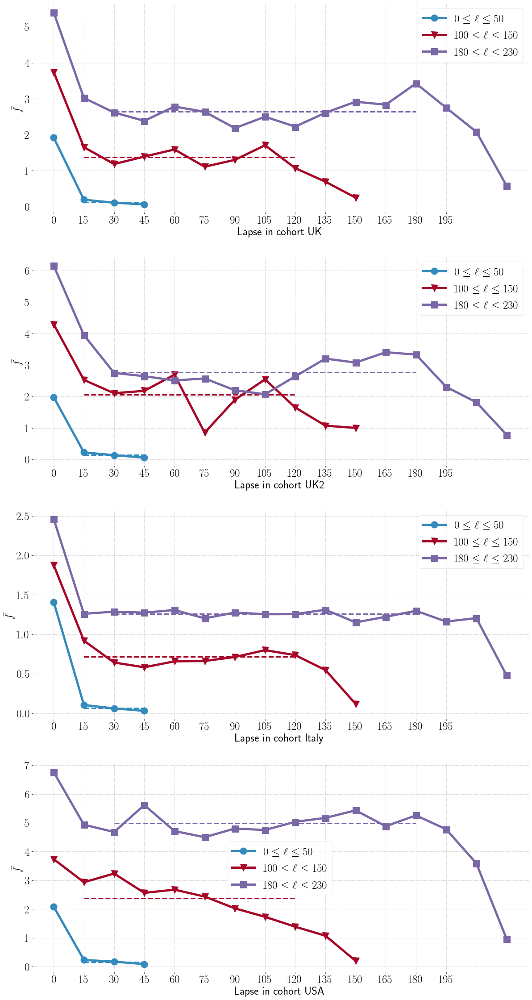

In [7]:
plt.figure(figsize=(20, 40))
p = 1
labels = [fr'${limits[i][0]} \leq \ell \leq {limits[i][1]}$' for i in range(3)]
labels.append(r'$\ell >= 199$')
cohorts = ['UK', 'UK2', 'Italy', 'USA']
for c in ['uk', 'uk2', 'it', 'mit']:
    plt.subplot(4,1,p)
    plt.xlabel(f"Lapse in cohort {cohorts[p - 1]}")
    plt.ylabel(r"$\bar{f}$")
    plt.xticks(range(0, 201, 15))
    for lamb in stablec[c].keys():
        l = int(lamb)
        plt.plot([15 * x for x in stablec[c][l].index], stablec[c][l]['f'], marker=markers[l], ls="-", lw=5, markersize=15, label=labels[l])
        plt.plot([15 * x for x in dashed[c][l][0]], dashed[c][l][1], marker="", ls="--", lw=3, c=colors[l])
    plt.legend()
    p += 1

In [8]:
# for c in stablec.keys():
#     tmp = pd.DataFrame()
#     for l in stablec[c].keys():
#         df = stablec[c][l]
#         df.columns = [f'l{int(l)}']
#         if len(tmp) == 0:
#             tmp = tmp.append(df)
#         else:
#             tmp = tmp.merge(df, left_index=True, right_index=True, how='outer')
#     tmp.index.rename('a', inplace=True)
#     tmp.fillna('nan', inplace=True)
#     tmp = tmp.loc[tmp.index < 13]
#     tmp.to_csv(f"../commpatterns/PNAS_paper/figs/fig2d_{c}.dat", header=True, sep="\t")

## fig 3

In [9]:
tmp = {}
for c in calls.keys():
    tmp[c] = pc.get_f(calls[c], 'all', 30, 10)
    
with open('../itdata/mtl_fig3.pickle', 'rb') as handle:
    tmp['it'] = pickle.load(handle)
    handle.close()
    
alldff2 = {}
for c in ['uk', 'uk2', 'it', 'mit']:
    alldff2[c] = {}
    nump = 0
    nump2 = 0
    for ego in tmp[c].keys():
        alldff2[c][ego] = {}
        for alter in tmp[c][ego].keys():
            ell = lives[c][ego][alter]['ell']
            nump += 1
            if ell < 201:
                alldff2[c][ego][alter] = tmp[c][ego][alter]
                nump2 += 1
    print(c, nump, nump2)

uk 4595 3978
uk2 1709 1527
it 15653 13657
mit 5999 5146


In [10]:
alldff2['all'] = {}
for c in ['uk', 'mit', 'it']:
    alldff2['all'].update(alldff2[c])
    
len(alldff2['all']) == len(alldff2['uk']) + len(alldff2['mit']) + len(alldff2['it'])

True

In [11]:
survall = pc.get_survival(alldff2['all'])

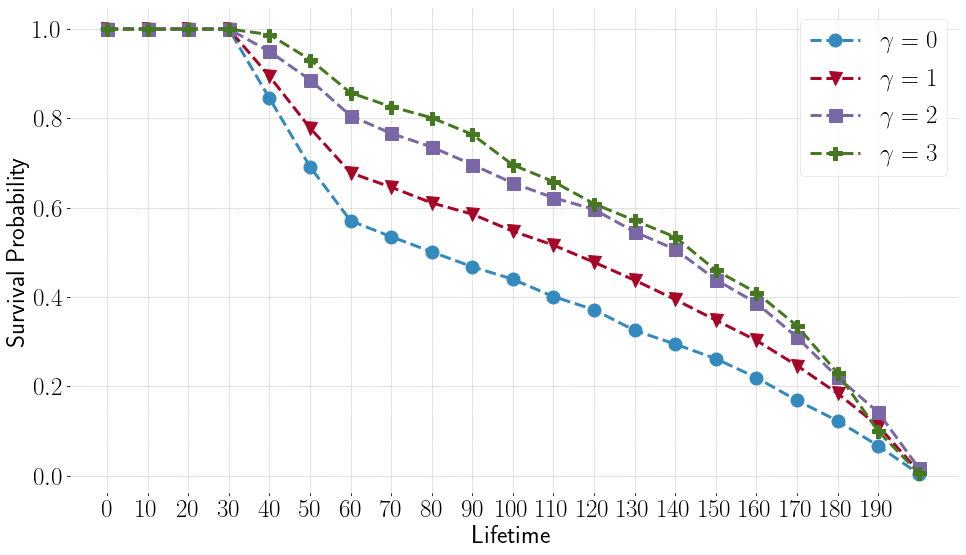

In [12]:
plt.figure(figsize=(16,9))
plt.xlabel(f"Lifetime ")
plt.ylabel("Survival Probability")
plt.xticks(range(0, 200, 10))
df = survall
for gamma in range(4):
    plt.plot([10 * x for x in df[gamma].index], df[gamma][0], marker=markers[gamma], markersize=13, ls="--", lw=3, label=fr'$\gamma = {gamma}$')
plt.legend()

In [13]:
# tmp = pd.DataFrame({'lc': list(survall[0].index)})
# for s in range(5):
#     df = survall[s]
#     tmp[f'p{int(s)}'] = df[0]
# tmp.to_csv(f'../commpatterns/PNAS_paper/figs/allsurvivalb.dat', header=True, index=False, sep="\t")

## Fig 4

In [14]:
dffUM = {}
for c in ['uk', 'mit']:
    dffUM.update(alldff2[c])
    
surv_cont = pc.get_survival(dffUM)

In [15]:
# tmp = pd.DataFrame()
# for s in range(6):
#     df = surv_cont[s].reset_index()
#     df.columns = ['lc', 'p']
#     df['lc'] *= 10
#     df['f'] = 2**s
#     ttmmpp = pd.DataFrame({'x': df['f'], 'y': df['lc'], 'z': df['p']})
#     tmp = tmp.append(ttmmpp).reset_index(drop=True)
# tmp.to_csv(f"../commpatterns/PNAS_paper/figs/contour.dat", header=False, index=False, sep="\t")

In [16]:
points_it = pc.get_survival(alldff2['it'], unbinned=True)

# tmp = pd.DataFrame()
# for s in points_it.keys():
#     if s <= 2**5 + 1:
#         df = points_it[s].reset_index()
#         df.columns = ['lc', 'p']
#         df['lc'] *= 10
#         df['f'] = s
#         ttmmpp = pd.DataFrame({'x': df['f'], 'y': df['lc'], 'z': df['p']})
#         tmp = tmp.append(ttmmpp).reset_index(drop=True)
# sub = [(i/4, (i + 1)/4) for i in range(4)]
# p = 0
# for s in sub:
#     df = tmp.loc[(tmp['z'] > s[0]) & (tmp['z'] <= s[1])]
#     df = df.drop(columns='z')
#     df.to_csv(f'../commpatterns/PNAS_paper/figs/points{p}.dat', header=False, index=False, sep="\t")
#     print(s)
#     p += 1

# SI (revised)

I need to produce a version of the calls dataframe that I will be able to modify tfor the different variants included in the SI.

## Different values of $\Delta a$.

In [17]:
limits = {}
limits[0] = (0, 66)
limits[1] = (67, 133)
limits[2] = (134, 199)

In [18]:
supB = {}
for c in calls.keys():
    supB[c] = {}
    for Da in [7, 15, 30, 45]:
        supB[c][Da] = {}
        dff = pc.get_f(calls[c], 'all', Da, 67)
        for i in limits.keys():
            supB[c][Da][i] = pc.get_avgfa(dff, lives[c], limits[i][0], limits[i][1])

And Italy is also required

In [19]:
with open('../itdata/mtl_supB.pickle', 'rb') as handle:
    supB['it'] = pickle.load(handle)
    handle.close()
    
# supB['it'] = {}    
# for Da in tmp.keys():
#     supB['it'][Da] = {}
#     for i in limits.keys():
#         supB['it'][Da][i] = pc.get_avgfa(tmp[Da], lives['it'], limits[i][0], limits[i][1])

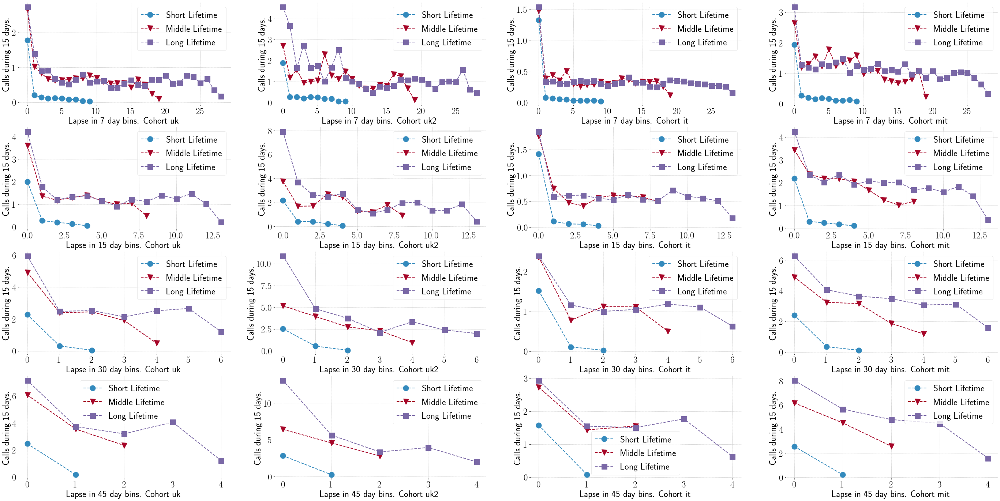

In [20]:
plt.figure(figsize=(48, 24))
labels = ['Short Lifetime', 'Middle Lifetime', 'Long Lifetime']
p = 1
for Da in supB['uk'].keys():
    for c in ['uk', 'uk2', 'it', 'mit']:
        plt.subplot(4,4,p)
        plt.xlabel(f"Lapse in {Da} day bins. Cohort {c}")
        plt.ylabel(fr"Calls during 15 days.")
        for l in supB[c][Da].keys():
            plt.plot(supB[c][Da][int(l)].index, supB[c][Da][l]['f'], marker=markers[int(l)], markersize=15, ls="--", label=labels[int(l)])
        plt.legend()
        p += 1

In [21]:
lines = {}
lines[7] = {}
for lamb in range(3):
    lines[7][lamb] = ([1,3,3][lamb], [9, 15, 27][lamb])
lines[15] = {}
for lamb in range(3):
    lines[15][lamb] = (1, [4,8,12][lamb])
lines[30] = {}
for lamb in range(3):
    lines[30][lamb] = (1, [2,3,5][lamb])
lines[45] = {}
for lamb in range(3):
    lines[45][lamb] = (1, [1,2,3][lamb])

In [22]:
for c in ['uk', 'uk2', 'it', 'mit']:
    print(f'======================={c}=====================')
    for Da in supB[c].keys():
        print(f'===={Da}====')
        for lamb in supB[c][Da].keys():
            df = supB[c][Da][lamb].loc[(supB[c][Da][lamb].index >= lines[Da][lamb][0]) & (supB[c][Da][lamb].index <= lines[Da][lamb][1])]
            h = np.mean(df['f'])
            print(f'\draw[dashed, {["charmander", "squirtle", "ekans"][int(lamb)]}, ultra thick] (axis cs: {lines[Da][lamb][0]}, {h}) -- (axis cs: {lines[Da][lamb][1]}, {h});')

=======================uk=====================
====7====
\draw[dashed, charmander, ultra thick] (axis cs: 1, 0.10511518741291692) -- (axis cs: 9, 0.10511518741291692);
\draw[dashed, squirtle, ultra thick] (axis cs: 3, 0.6227129645854) -- (axis cs: 15, 0.6227129645854);
\draw[dashed, ekans, ultra thick] (axis cs: 3, 0.6096801302664746) -- (axis cs: 27, 0.6096801302664746);
====15====
\draw[dashed, charmander, ultra thick] (axis cs: 1, 0.16332183718448368) -- (axis cs: 4, 0.16332183718448368);
\draw[dashed, squirtle, ultra thick] (axis cs: 1, 1.114013861504313) -- (axis cs: 8, 1.114013861504313);
\draw[dashed, ekans, ultra thick] (axis cs: 1, 1.2669866362864932) -- (axis cs: 12, 1.2669866362864932);
====30====
\draw[dashed, charmander, ultra thick] (axis cs: 1, 0.1796337461914624) -- (axis cs: 2, 0.1796337461914624);
\draw[dashed, squirtle, ultra thick] (axis cs: 1, 2.2454206322008274) -- (axis cs: 3, 2.2454206322008274);
\draw[dashed, ekans, ultra thick] (axis cs: 1, 2.4627543512499406)

In [23]:
# for c in supB.keys():
#     tmp = pd.DataFrame(index=list(range(29)))
#     for Da in supB[c].keys():
#         for lamb in supB[c][Da].keys():
#             df = supB[c][Da][lamb]
#             if (lamb == 2) and (Da < 30):
#                 df = df.loc[df.index < list(df.index)[-1]] # To crop the last part of the longer lifetime series
#             df.columns = [f'Da{Da}l{int(lamb)}']
#             tmp = tmp.merge(df, left_index=True, right_index=True, how='outer')
#         tmp.index.rename('a', inplace=True)
#         tmp.fillna('nan', inplace=True)
#         tmp.to_csv(f"../commpatterns/PNAS_paper/SI/figs/SIb_{c}.dat", header=True, sep="\t")

## Variations on each lifetime group

In [24]:
limits = {}
limits['s0'] = (0, 66)
limits['s1'] = (0, 40)
limits['s2'] = (0, 50)
limits['s3'] = (0, 70)

limits['m0'] = (67, 133)
limits['m1'] = (67, 100)
limits['m2'] = (67, 115)
limits['m3'] = (67, 150)

limits['l0'] = (134, 199)
limits['l1'] = (134, 210)
limits['l2'] = (134, 220)
limits['l3'] = (134, 220)

In [25]:
supC = {}
for c in ['uk', 'uk2', 'mit']:
    supC[c] = {}
    for lf in limits.keys():
        supC[c][lf] = pc.get_avgfa(alldff[c], lives[c], limits[lf][0], limits[lf][1])

In [26]:
with open('../itdata/mtl_supC.pickle', 'rb') as handle:
    supC['it'] = pickle.load(handle)
    handle.close()

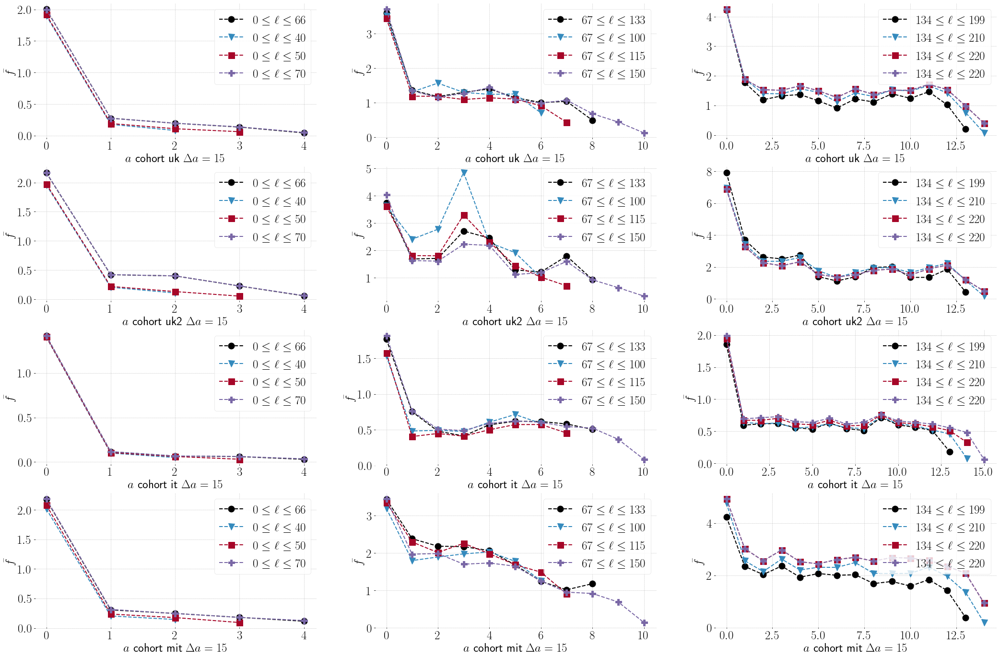

In [27]:
plt.figure(figsize=(36, 24))
p = 1
for c in ['uk', 'uk2', 'it', 'mit']:
    for lf in ['s', 'm', 'l']:
        plt.subplot(4,3,p)
        plt.xlabel(fr"$a$ cohort {c} $\Delta a = 15$")
        plt.ylabel(r"$\bar{f}$")
        for i in range(4):
            key = lf + str(i)
            if i == 0:
                plt.plot(supC[c][key].index, supC[c][key]['f'], marker=markers[i], markersize=13, ls="--", lw=2, color="black", label=fr"${limits[key][0]} \leq \ell \leq {limits[key][1]}$")
            else:
                plt.plot(supC[c][key].index, supC[c][key]['f'], marker=markers[i], markersize=13, ls="--", lw=2, label=fr"${limits[key][0]} \leq \ell \leq {limits[key][1]}$")
        plt.legend()
        p += 1

In [28]:
# for c in supC.keys():
#     tmp = pd.DataFrame(index=list(range(14)))
#     for series in supC[c].keys():
#         data = supC[c][series].copy(deep=True)
#         data.columns = [f'{series}']
#         tmp = tmp.merge(data, left_index=True, right_index=True, how='outer')
#     tmp = tmp.fillna('nan')
#     tmp.index.rename('a', inplace=True)
#     tmp = tmp.loc[tmp.index < 13]
#     tmp.to_csv(f"../commpatterns/PNAS_paper/SI/figs/SIc_{c}.dat", header=True, sep="\t")

In [29]:
supC.keys()

dict_keys(['uk', 'uk2', 'mit', 'it'])

## Distribution of $g$

In [30]:
t0 = dt.datetime.now()
supD = {}
for c in ['uk', 'uk2', 'mit']:
    df = calls[c].copy(deep=True)
    df['ea'] = list(zip(df['ego'], df['alter']))
    lifetime = df.groupby('ea')[['aclock']].max()
    lifetime = lifetime.loc[lifetime['aclock'] <= 199]
    df = df[df['ea'].isin(lifetime.index)]
    g = df.groupby('ea')[['time']].count()
    Hall = pc.histogram(g['time'], 30)
    df2 = df.loc[(df['aclock'] >= 30) & (df['aclock'] <= 60)]
    g = df2.groupby('ea')[['time']].count()
    H = pc.histogram(g['time'], 30)
    supD[c] = (Hall, H)
print(f'Took {dt.datetime.now() - t0}')

Took 0:00:00.135235


In [31]:
with open('../itdata/mtl_supD.pickle', 'rb') as handle:
    supD['it'] = pickle.load(handle)
    handle.close()

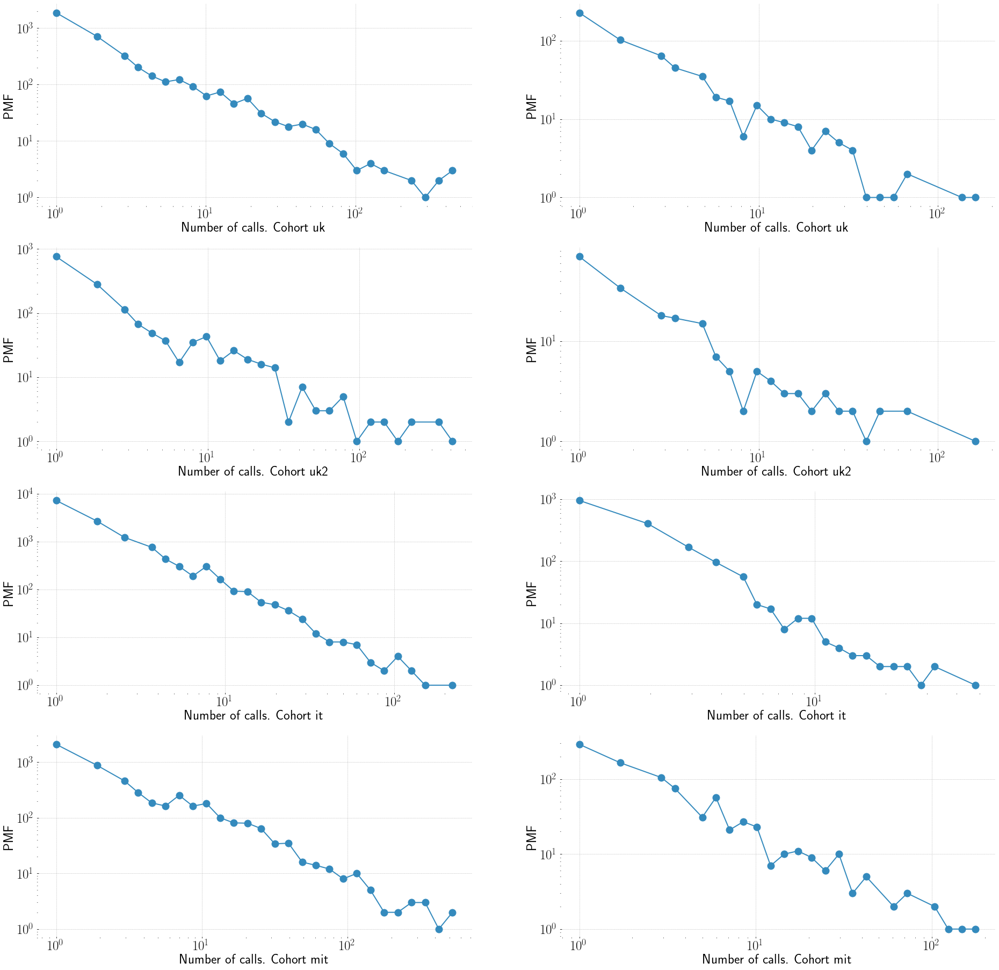

In [32]:
plt.figure(figsize=(32, 32))
p = 1
for c in ['uk', 'uk2', 'it', 'mit']:
    for i in range(2):
        plt.subplot(4,2,p)
        plt.xlabel(f"Number of calls. Cohort {c}")
        plt.ylabel(f"PMF")
        plt.loglog()
        df = supD[c][i]
        plt.plot(df['label'], df['h'], "o-", markersize=13)
        p += 1

In [33]:
# tmp = pd.DataFrame(index=list(range(30)))
# for c in supD.keys():
#     for col in range(2):
#         df = supD[c][col].sort_index()
#         x = []
#         y = []
#         df2 = df.reset_index(drop=True)
#         for i in range(30):
#             if i in df2.index:
#                 x.append(df2.at[i, 'label'])
#                 y.append(df2.at[i, 'pmf'])
#             else:
#                 x.append('nan')
#                 y.append('nan')
#         tmp[f'{c+["a", "s"][col]}_x'] = x
#         tmp[f'{c+["a", "S"][col]}_y'] = y
# tmp.to_csv(f"../commpatterns/PNAS_paper/SI/figs/SId.dat", header=True, index=False, sep="\t")

## Different values for $a_o$ and $a_f$: fig 3

In [34]:
for c in calls.keys():
    print(max(calls[c]['aclock']))

231
231
231


In [35]:
def get_survival(callsdf, maxT, ao, af, lives, unbinned=False):
    tmp = {}
    df = callsdf.loc[(callsdf['aclock'] >= ao) & (callsdf['aclock'] <= af)]
    for ego in df['ego'].unique():
        df1 = df.loc[df['ego'] == ego]
        for alter in df1['alter'].unique():
            ell = lives[ego][alter]['ell']
            if ell <= maxT:
                df2 = df1.loc[df1['alter'] == alter]
                if unbinned:
                    g = len(df2)
                else:
                    g = int(np.log2(len(df2)))
                tmp[g] = tmp.get(g, {})
                lamb = ell // 10
                tmp[g][lamb] = tmp[g].get(lamb, 0) + 1
    tmp2 = {}
    for g in sorted(tmp.keys()):
        df = pd.DataFrame.from_dict(tmp[g], orient='index').sort_index()
        tmp2[g] = {}
        df['p'] = df[0].div(sum(df[0]))
        for lc in range(max(df.index) + 1):
            df2 = df.loc[df.index >= lc]
            tmp2[g][lc] = round(sum(df2['p']), 6)
        tmp2[g] = pd.DataFrame.from_dict(tmp2[g], orient='index').sort_index()
    return tmp2

In [36]:
lives['all'] = {}
for c in lives.keys():
    if c != 'uk2':
        lives['all'].update(lives[c])

In [37]:
# calls['all'] = calls['uk'].copy(deep=True)
# calls['all'] = calls['all'].append(calls['mit'])

# for c in calls.keys():
#     df = calls[c].copy(deep=True)
#     df['ea'] = list(zip(df['ego'], df['alter']))
#     ncalls = df.groupby('ea')[['time']].count()
#     ncalls = ncalls.loc[ncalls['time'] >= 3]
#     df = df[df['ea'].isin(ncalls.index)]

In [38]:
# len(lives['all'].keys()) == len(lives['uk'].keys()) + len(lives['mit'].keys())

In [39]:
# len(calls['all']) == len(calls['uk']) + len(calls['mit'])

In [40]:
limitsa = [(0, 30), (15, 45), (30, 60), (45, 75)]

In [41]:
# supE = {}
# for i in range(len(limitsa)):
#     supE[i] = get_survival(calls['all'], 199, limitsa[i][0], limitsa[i][1], lives['all'])

In [42]:
# plt.figure(figsize=(20, 40))
# p = 1
# for lima in supE.keys():
#     plt.subplot(4, 1, p)
#     plt.xlabel(fr"Lifetime. ${limitsa[lima][0]} \leq a \leq {limitsa[lima][1]}$")
#     plt.ylabel(f"Surv. prob. All cohorts")
#     for i in range(5):
#         plt.plot([x * 10 for x in supE[lima][i].index], supE[lima][i][0], marker=markers[i], markersize=13, ls="--", lw=3, label=fr'$\gamma = {i}$')
#     plt.legend()
#     p+=1

Another way to do this. Since I will need the information from Italy.

In [43]:
tmp = {}
tmp['all'] = {}
for c in ['uk', 'mit']:
    tmp[c] = pc.get_f(calls[c], 'all', 15, 10)
    
with open('../itdata/mtl_supE.pickle', 'rb') as handle:
    tmp['it'] = pickle.load(handle)
    handle.close()
    
for c in ['uk', 'it', 'mit']:
    tmp['all'].update(tmp[c])

dffa15 = {}
for c in tmp.keys():
    dffa15[c] = {}
    for ego in tmp[c].keys():
        dffa15[c][ego] = {}
        for alter in tmp[c][ego].keys():
            if lives[c][ego][alter]['ell'] < 199:
                dffa15[c][ego][alter] = tmp[c][ego][alter]

In [44]:
len(dffa15['all'].keys())

300

In [45]:
alphas = [(i, i + 1) for i in range(4)]
supE2 = {}
for i in range(len(alphas)):
    supE2[i] = pc.get_survival(dffa15['all'], alphafixed=alphas[i])

In [46]:
supE2.keys()

dict_keys([0, 1, 2, 3])

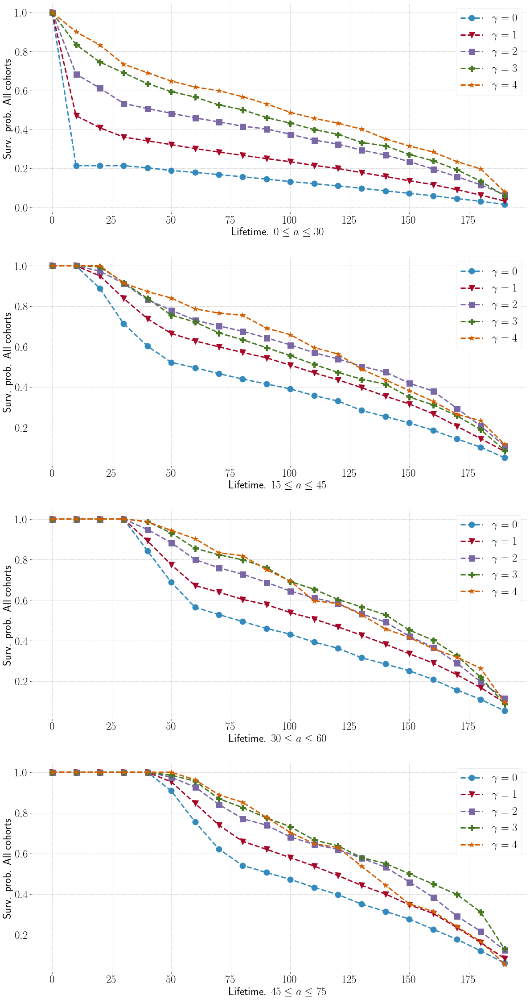

In [47]:
plt.figure(figsize=(20, 40))
p = 1
for lima in range(len(limitsa)):
    plt.subplot(4, 1, p)
    plt.xlabel(fr"Lifetime. ${limitsa[lima][0]} \leq a \leq {limitsa[lima][1]}$")
    plt.ylabel(f"Surv. prob. All cohorts")
    for i in range(5):
        plt.plot([x * 10 for x in supE2[lima][i].index], supE2[lima][i][0], marker=markers[i], markersize=13, ls="--", lw=3, label=fr'$\gamma = {i}$')
    plt.legend()
    p+=1

## Intervent times

There are two ways in which I can compute the time between phone calls.

1. By taking the difference between two consecutive phone calls.
2. By counting the number of days without communication

They both measure something similar, but I will test if the results are similar.

### Difference between consecutive calls

In [48]:
def histogram(array, bins, log=True):
    xl = sorted(list(array))
    xo = xl[0]
    xf = xl[-1]
    if log:
        lmu = np.log10(xf / xo) / bins
        mu = 10**lmu
    dx = (xf - xo) / bins
    h = {}
    if log:
        for x in xl:
            if x == xf:
                h[bins - 1] = h.get(bins - 1, 0) + 1
            else:
                i = np.log10(x / xo) // lmu
                h[i] = h.get(i, 0) + 1
    else:
        for x in xl:
            if x == xf:
                h[bins - 1] = h.get(bins - 1, 0) + 1
            else:
                i = int((x - xo) // dx)
                h[i] = h.get(i, 0) + 1
    df = pd.DataFrame.from_dict(h, orient='index', columns=['h'])
    df['pmf'] = df['h'].div(sum(df['h']))
    for i in df.index:
        if log:
            df.at[i, 'label'] = xo*(mu**i)
        else:
            df.at[i, 'label'] = xo + (dx * (i + 0.5))
    return df

In [49]:
def consecutive(callsdf, ello, ellf, dayres=1):
    allie = []
    cv = []
    df = callsdf.copy()
    df['ea'] = list(zip(df['ego'], df['alter']))
    lifetime = df.groupby('ea')[['aclock']].max()
    lifetime = lifetime.loc[(lifetime['aclock'] >= ello) & (lifetime['aclock'] <= ellf)]
    use = list(lifetime.index)
    df = df[df['ea'].isin(use)]  
    for ego in df['ego'].unique():
        df1 = df.loc[df['ego'] == ego]
        for alter in df1['alter'].unique():
            df2 = df1.loc[df['alter'] == alter]
            if len(df2) > 2:
                df2 = df2.sort_values(by='time')
                mint = min(df['time'])
                dft = df2.copy().drop(columns=['aclock'])
                dft['aclock'] = (df2['time'] - mint).dt.days
                ie = list(dft['aclock'].diff())[1:]
                if dayres > 1:
                    ie = [x // dayres for x in ie]
                allie += ie
                if (np.nanmean(ie) == 0) and (np.nanstd(ie) == 0):
                    cvego = 1
                elif (np.nanmean(ie) == 0) and (np.nanstd(ie) > 0):
                    cvego = np.nanstd(ie)
                else:
                    cvego = np.nanstd(ie) / np.nanmean(ie)
                if (not pd.isna(cvego)):
                    cv.append(cvego)
    mean = np.mean(cv)
    std = np.std(cv)
    H = histogram(allie, 10, log=False)
    Hcv = histogram(cv, 10, log=False)
    return (H, Hcv, mean, std, allie)

In [50]:
limits = {}
limits[0] = (0, 66)
limits[1] = (67, 133)
limits[3] = (134, 199)
limits['all'] = (0, 199)

In [51]:
t0 = dt.datetime.now()
consec = {}
for c in ['uk', 'uk2', 'mit']:
    consec[c] = {}
    for dr in [1,2,4,8,16]:
        consec[c][dr] = {}
        for k in limits.keys():
            consec[c][dr][k] = consecutive(calls[c], limits[k][0], limits[k][1], dayres=dr)
        print(f'Cohort {c}, res {dr} took {dt.datetime.now() - t0}')
        t0 = dt.datetime.now()

Cohort uk, res 1 took 0:00:48.367202
Cohort uk, res 2 took 0:00:48.462042
Cohort uk, res 4 took 0:00:49.759072
Cohort uk, res 8 took 0:00:49.738212
Cohort uk, res 16 took 0:00:50.417321
Cohort uk2, res 1 took 0:00:07.002628
Cohort uk2, res 2 took 0:00:06.332855
Cohort uk2, res 4 took 0:00:08.267431
Cohort uk2, res 8 took 0:00:06.350380
Cohort uk2, res 16 took 0:00:07.652249
Cohort mit, res 1 took 0:02:00.073410
Cohort mit, res 2 took 0:02:00.633355
Cohort mit, res 4 took 0:02:00.144989
Cohort mit, res 8 took 0:02:00.071162
Cohort mit, res 16 took 0:02:00.010601


In [52]:
with open('../itdata/mtl_consec.pickle', 'rb') as handle:
    consec['it'] = pickle.load(handle)
    handle.close()

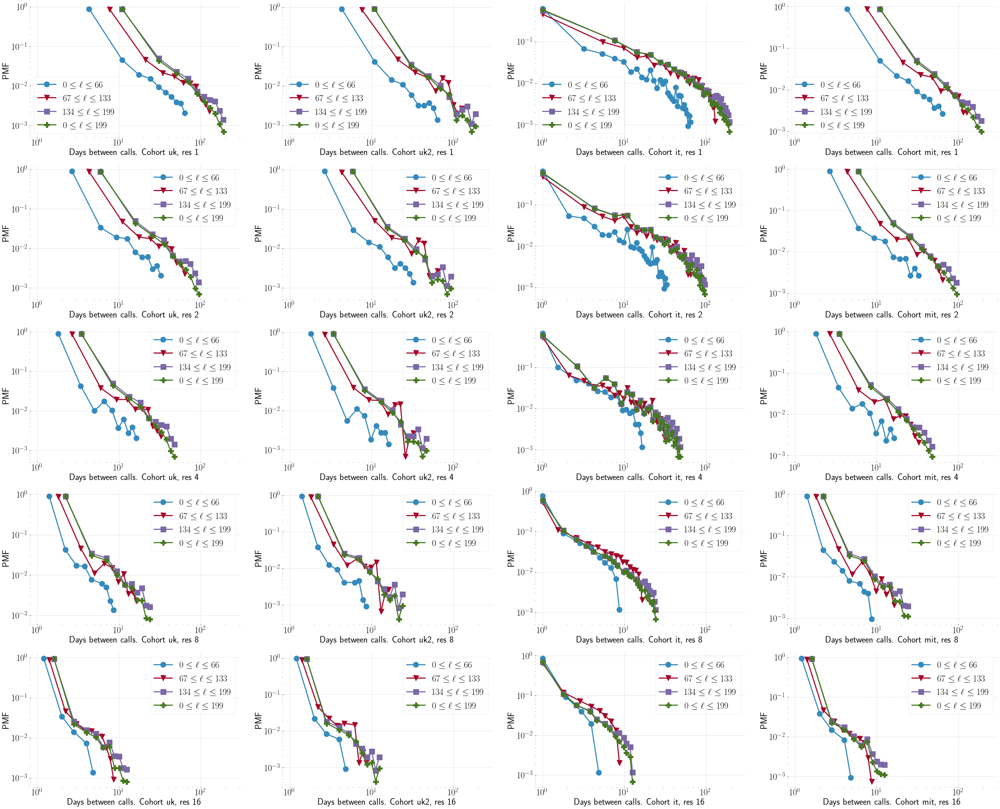

In [53]:
plt.figure(figsize=(48, 40))
p = 1
for dr in [1,2,4,8,16]:
    for c in ['uk', 'uk2', 'it', 'mit']:
        plt.subplot(5,4,p)
        plt.xlabel(f"Days between calls. Cohort {c}, res {dr}")
        plt.ylabel("PMF")
        plt.xlim(0.8, 301)
        plt.loglog()
        m = 0
        for k in consec[c][dr].keys():
            plt.plot(consec[c][dr][k][0]['label'] + 1, consec[c][dr][k][0]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3, 
                     label=fr'${limits[k][0]} \leq \ell \leq {limits[k][1]}$')
            m += 1
        plt.legend()
        p += 1

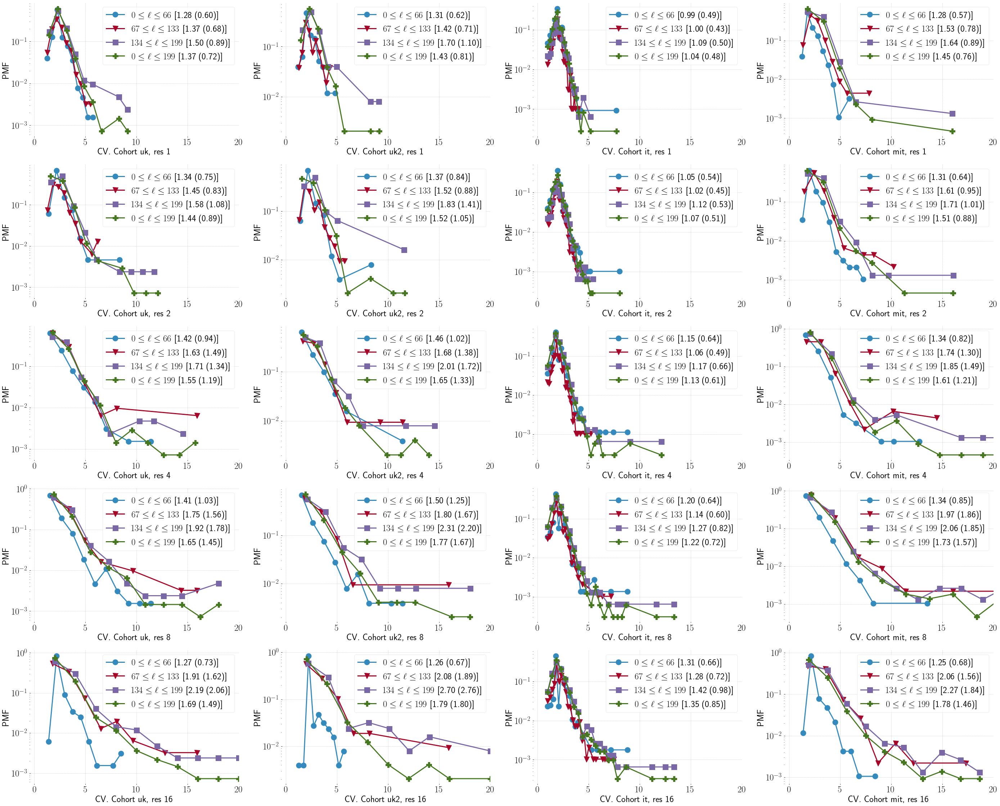

In [54]:
plt.figure(figsize=(48, 40))
p = 1
for dr in [1,2,4,8,16]:
    for c in ['uk', 'uk2', 'it', 'mit']:
        plt.subplot(5,4,p)
        plt.xlabel(f"CV. Cohort {c}, res {dr}")
        plt.ylabel("PMF")
        plt.xlim(-0.5, 20)
        plt.semilogy()
        m = 0
        for k in consec[c][dr].keys():
            plt.plot(consec[c][dr][k][1]['label'] + 1, consec[c][dr][k][1]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3, 
                     label=fr'${limits[k][0]} \leq \ell \leq {limits[k][1]}$ [{consec[c][dr][k][2]:.2f} ({consec[c][dr][k][3]:.2f})]')
            m += 1
        plt.legend()
        p += 1

### Count gap length

In [55]:
def gaps(callsdf, ello, ellf, dayres=1, zero=False):
    allgaps = []
    allcv = []
    df = callsdf.copy()
    df['ea'] = list(zip(df['ego'], df['alter']))
    lifetime = df.groupby('ea')[['aclock']].max()
    lifetime = lifetime.loc[(lifetime['aclock'] >= ello) & (lifetime['aclock'] <= ellf)]
    df1 = df[df['ea'].isin(lifetime.index)]
    for ego in df1['ego'].unique():
        df2 = df1.loc[df1['ego'] == ego]
        for alter in df2['alter'].unique():
            df3 = df2.loc[df2['alter'] == alter]
            if len(df3) > 1:
                gaps = []
                df4 = df3.sort_values(by='time')
                maxa = max(df4['aclock'])
                d = 0
                for i in range(maxa + 1):
                    if i not in df4['aclock'].unique():
                        d += 1
                    elif (not zero) and (d != 0):
                        gaps.append(d)
                        d = 0
                    elif zero and d == 0:
                        gaps.append(d)
                    elif zero and d > 0:
                        gaps.append(d)
                        d = 0                        
                if dayres > 1:
                    gaps = [x // dayres for x in gaps]
                allgaps += gaps
                cv = np.nanstd(gaps) / np.nanmean(gaps)
                if not pd.isna(cv):
                    allcv.append(cv)
                    
    H = pc.histogram(allgaps, 30, log=False)
    H['label'] = H['label'].replace({0:0.1})
    Hcv = pc.histogram(allcv, 30, log=False)
    mcv = np.mean(allcv)
    scv = np.std(allcv)
    return (H, Hcv, mcv, scv)

In [56]:
t0 = dt.datetime.now()
gapsplot = {}
for c in ['uk', 'uk2', 'mit']:
    gapsplot[c] = {}
    for dr in [1,2,4,8,16]:
        gapsplot[c][dr] = {}
        for k in limits.keys():
            gapsplot[c][dr][k] = gaps(calls[c], limits[k][0], limits[k][1], dayres=dr)
        print(f'Cohort {c}, res {dr} took {dt.datetime.now() - t0}')
        t0 = dt.datetime.now()

/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk, res 1 took 0:00:11.352782


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk, res 2 took 0:00:11.296944


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(g

Cohort uk, res 4 took 0:00:11.305028


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar

Cohort uk, res 8 took 0:00:11.308095


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar

Cohort uk, res 16 took 0:00:11.371041


/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk2, res 1 took 0:00:03.814302


/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk2, res 2 took 0:00:03.817828


/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(g

Cohort uk2, res 4 took 0:00:03.832411


/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(g

Cohort uk2, res 8 took 0:00:03.828912


/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(g

Cohort uk2, res 16 took 0:00:03.822728


/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort mit, res 1 took 0:00:16.934252


/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort mit, res 2 took 0:00:16.960770


/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort mit, res 4 took 0:00:16.931345


/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(g

Cohort mit, res 8 took 0:00:16.979708


/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
/home/vsvh/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: Mean of empty slice
  cv = np.nanstd(g

Cohort mit, res 16 took 0:00:16.989467


In [57]:
with open('../itdata/mtl_gaps.pickle', 'rb') as handle:
    gapsplot['it'] = pickle.load(handle)
    handle.close()

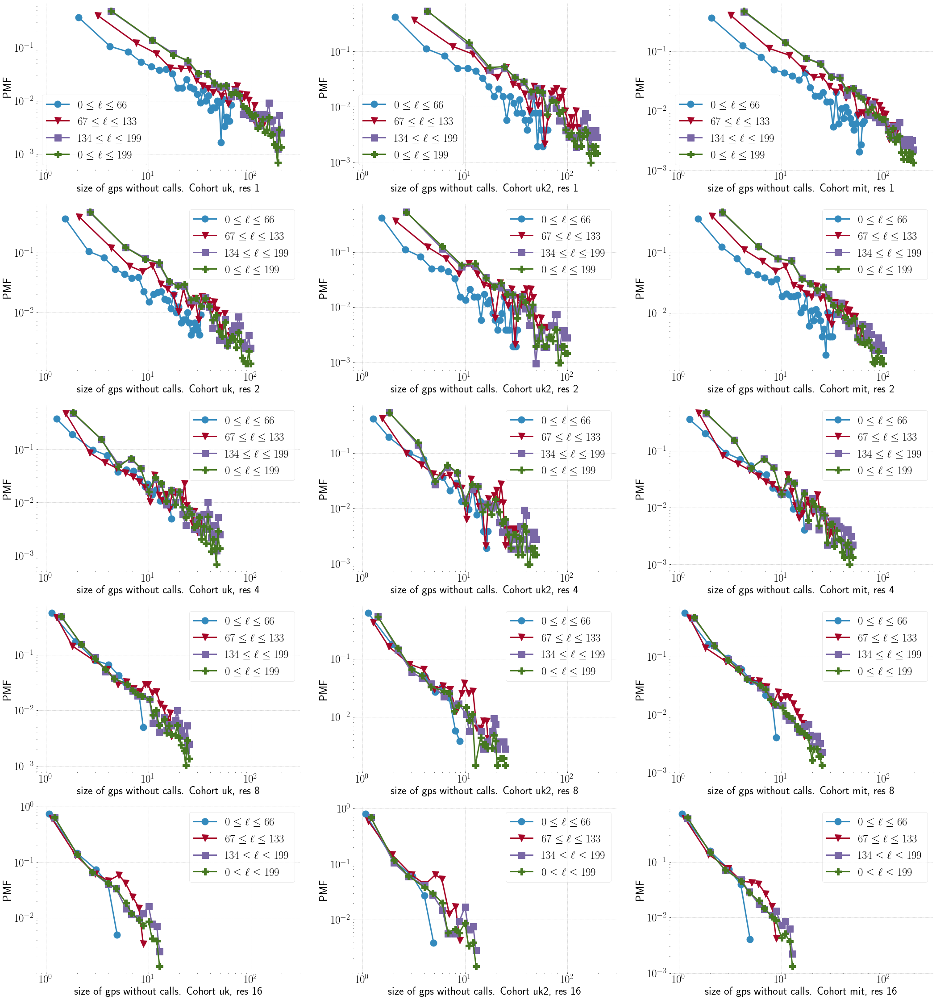

In [58]:
plt.figure(figsize=(36, 40))
p = 1
for dr in [1,2,4,8,16]:
    for c in ['uk', 'uk2', 'mit']:
        plt.subplot(5,3,p)
        plt.xlabel(f"size of gps without calls. Cohort {c}, res {dr}")
        plt.ylabel("PMF")
        plt.loglog()
        plt.xlim(0.8, 301)
        m = 0
        for k in gapsplot[c][dr].keys():
            if dr == 1:
                plt.plot(gapsplot[c][dr][k][0]['label'], gapsplot[c][dr][k][0]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3,
                     label=fr'${limits[k][0]} \leq \ell \leq {limits[k][1]}$')
            else:
                plt.plot(gapsplot[c][dr][k][0]['label'] + 1, gapsplot[c][dr][k][0]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3,
                     label=fr'${limits[k][0]} \leq \ell \leq {limits[k][1]}$')
            m += 1
        plt.legend()
        p += 1

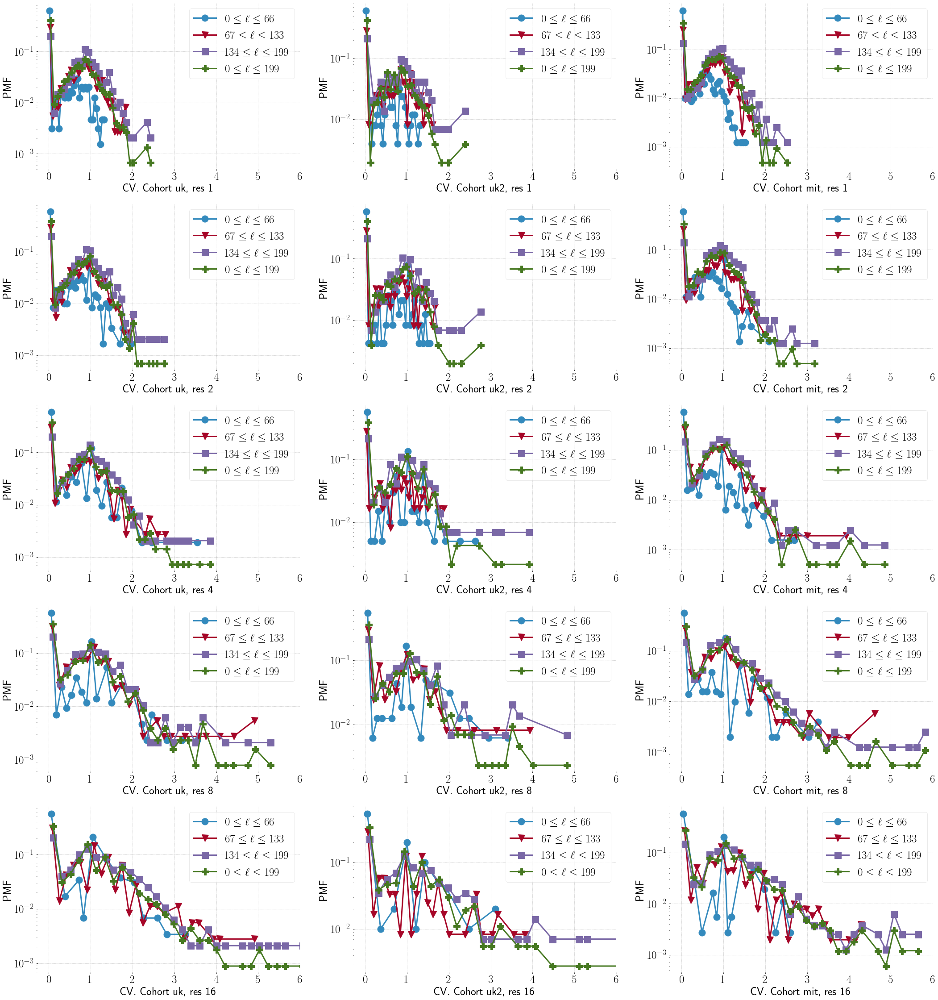

In [59]:
plt.figure(figsize=(36, 40))
p = 1
for dr in [1,2,4,8,16]:
    for c in ['uk', 'uk2', 'mit']:
        plt.subplot(5,3,p)
        plt.xlabel(f"CV. Cohort {c}, res {dr}")
        plt.ylabel("PMF")
        plt.xlim(-0.3, 6)
        plt.semilogy()
        m = 0
        for k in gapsplot[c][dr].keys():
            plt.plot(gapsplot[c][dr][k][1]['label'], gapsplot[c][dr][k][1]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3, 
                     label=fr'${limits[k][0]} \leq \ell \leq {limits[k][1]}$')
            m += 1
        plt.legend()
        p += 1

### Gaps including zero

In [60]:
t0 = dt.datetime.now()
gapsplot2 = {}
for c in ['uk', 'uk2', 'mit']:
    gapsplot2[c] = {}
    for dr in [1,2,4,8,16]:
        gapsplot2[c][dr] = {}
        for k in limits.keys():
            gapsplot2[c][dr][k] = gaps(calls[c], limits[k][0], limits[k][1], dayres=dr, zero=True)
        print(f'Cohort {c}, res {dr} took {dt.datetime.now() - t0}')
        t0 = dt.datetime.now()

<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk, res 1 took 0:00:11.244810


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk, res 2 took 0:00:11.234687


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk, res 4 took 0:00:11.222242


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk, res 8 took 0:00:11.244500


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk, res 16 took 0:00:11.195785


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk2, res 1 took 0:00:03.786402


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk2, res 2 took 0:00:03.790936


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk2, res 4 took 0:00:03.795185


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk2, res 8 took 0:00:03.793223


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort uk2, res 16 took 0:00:03.805595


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort mit, res 1 took 0:00:16.893250


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort mit, res 2 took 0:00:16.882969


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort mit, res 4 took 0:00:16.942680


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort mit, res 8 took 0:00:16.901267


<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)
<ipython-input-55-f019f6aa93d2>:32: RuntimeWarning: invalid value encountered in double_scalars
  cv = np.nanstd(gaps) / np.nanmean(gaps)


Cohort mit, res 16 took 0:00:16.877329


In [61]:
with open('../itdata/mtl_gaps.pickle', 'rb') as handle:
    gapsplot2['it'] = pickle.load(handle)
    handle.close()

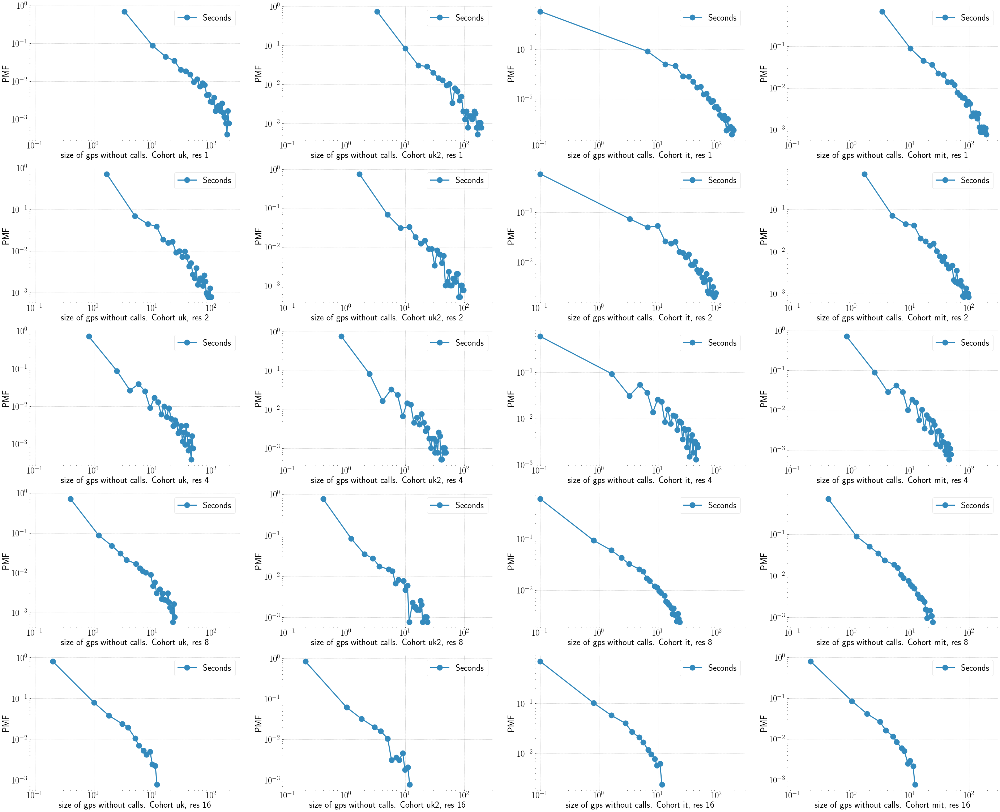

In [62]:
plt.figure(figsize=(48, 40))
p = 1
for dr in [1,2,4,8,16]:
    for c in ['uk', 'uk2', 'it', 'mit']:
        plt.subplot(5,4,p)
        plt.xlabel(f"size of gps without calls. Cohort {c}, res {dr}")
        plt.ylabel("PMF")
        plt.loglog()
        plt.xlim(0.08, 301)
        m = 0
        plt.plot(gapsplot2[c][dr][k][0]['label'], gapsplot2[c][dr][k][0]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3,
                     label=fr'Seconds')
        plt.legend()
        p += 1

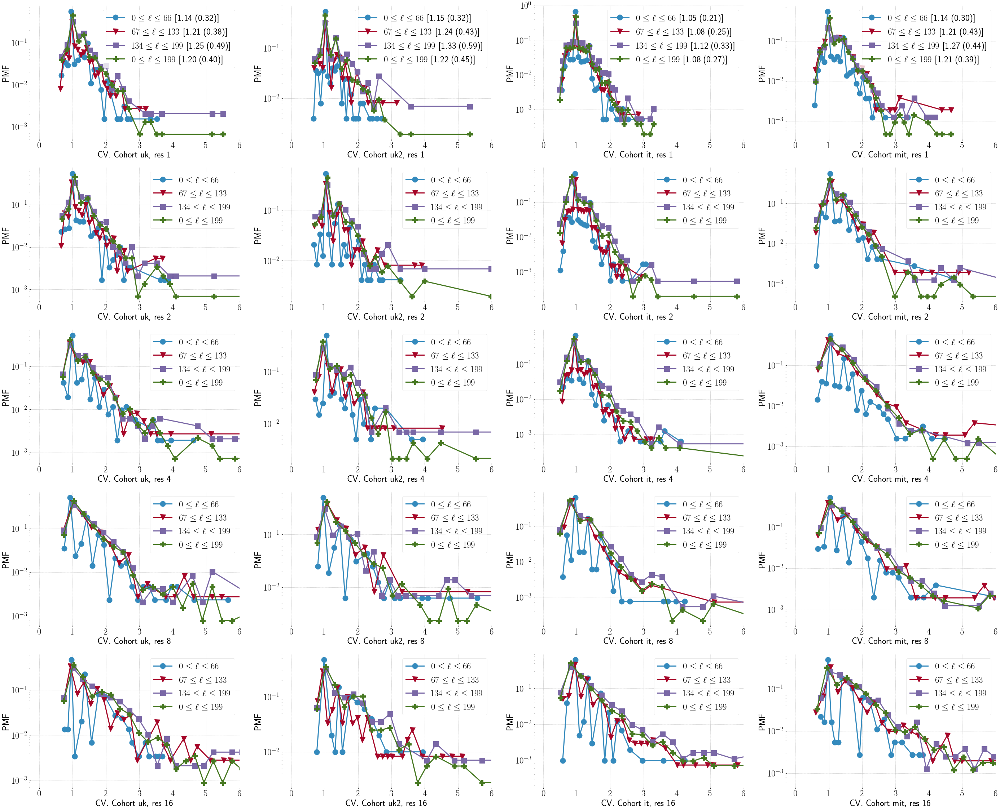

In [63]:
plt.figure(figsize=(48, 40))
p = 1
for dr in [1,2,4,8,16]:
    for c in ['uk', 'uk2', 'it', 'mit']:
        plt.subplot(5,4,p)
        plt.xlabel(f"CV. Cohort {c}, res {dr}")
        plt.ylabel("PMF")
        plt.xlim(-0.3, 6)
        plt.semilogy()
        m = 0
        for k in gapsplot2[c][dr].keys():
            if dr != 1:
                plt.plot(gapsplot2[c][dr][k][1]['label'], gapsplot2[c][dr][k][1]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3, 
                     label=fr'${limits[k][0]} \leq \ell \leq {limits[k][1]}$')
            else:
                plt.plot(gapsplot2[c][dr][k][1]['label'], gapsplot2[c][dr][k][1]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3, 
                     label=fr'${limits[k][0]} \leq \ell \leq {limits[k][1]}$ [{gapsplot2[c][dr][k][2]:.2f} ({gapsplot2[c][dr][k][3]:.2f})]')
            m += 1
        plt.legend()
        p += 1

In [64]:
for c in gapsplot2.keys():
    tmp = pd.DataFrame()
    for i in gapsplot2[c][1].keys():
        df = gapsplot2[c][1][i][1]
        tmp[f'x{i}'] = df['label']
        tmp[f'y{i}'] = df['pmf']
    tmp = tmp.fillna('nan')
    tmp.to_csv(f"../commpatterns/PNAS_paper/SI/figs/cvgaps_{c}.dat", header=True, index=False, sep="\t")

In [65]:
tmp

,x0,y0,x1,y1,x3,y3,xall,yall
0,0.547723,0.003625,0.556488,0.007252,0.483267,0.00377,0.483267,0.001935
1,0.630680,0.017607,0.635301,0.034083,0.580327,0.02531,0.580327,0.014515
2,0.713637,0.040394,0.714115,0.050761,0.677388,0.072698,0.677388,0.059028
3,0.796595,0.027447,0.792928,0.053662,0.774448,0.073775,0.774448,0.059222
4,0.879552,0.027965,0.871742,0.062364,0.871509,0.091007,0.871509,0.062512
5,0.962510,0.674780,0.950555,0.431472,0.968569,0.314486,0.968569,0.489452
6,1.045467,0.032626,1.029368,0.059463,1.065629,0.085622,1.065629,0.060964
7,1.128425,0.023822,1.108182,0.052937,1.16269,0.084006,1.16269,0.057867
8,1.211382,0.024340,1.186995,0.050036,1.25975,0.05762,1.25975,0.048578
9,1.294339,0.026411,1.265809,0.055838,1.356811,0.06462,1.356811,0.068705


In [66]:
gapsplot2['it'][1][0][1]

,h,pmf,label
0,7,0.003625,0.547723
1,34,0.017607,0.630680
2,78,0.040394,0.713637
3,53,0.027447,0.796595
4,54,0.027965,0.879552
5,1303,0.674780,0.962510
6,63,0.032626,1.045467
7,46,0.023822,1.128425
8,47,0.024340,1.211382
9,51,0.026411,1.294339


In [67]:
gapsplot2['it'][1][0][1]

,h,pmf,label
0,7,0.003625,0.547723
1,34,0.017607,0.630680
2,78,0.040394,0.713637
3,53,0.027447,0.796595
4,54,0.027965,0.879552
5,1303,0.674780,0.962510
6,63,0.032626,1.045467
7,46,0.023822,1.128425
8,47,0.024340,1.211382
9,51,0.026411,1.294339


### Lowering resolution

In [167]:
def calls_by_second(callsdf):
    df = callsdf.copy(deep=True)
    minT = min(df['time'])
    df['u'] = (df['time'] - minT).dt.total_seconds()
    df['ea'] = list(zip(df['ego'], df['alter']))
    ulocmin = df.groupby('ea')[['u']].min()
    df['a'] = df.index.map(lambda i: df.at[i, 'u'] - ulocmin['u'][df.at[i, 'ea']])
    df = df.sort_values(by=['ego', 'alter', 'time'])
    g = df.groupby('ea')[['time']].count()
    old = len(df['ea'].unique())
    g = g.loc[g['time'] > 3]
    df = df[df['ea'].isin(g.index)]
    new = len(df['ea'].unique())
    print(f'lost {old - new} pairs')
    df = df.drop(columns=['ea'])
    return df

In [170]:
def la_bys(callsdf, limitsmap):
    globaldf = pd.DataFrame()
    df = callsdf.copy(deep=True)
    df['ea'] = list(zip(df['ego'], df['alter']))
    lf = df.groupby('ea')[['aclock']].max()
    minT = min(df['time'])
    for i in limitsmap:
        lf1 = lf.loc[(lf['aclock'] >= limitsmap[i][0]) & (lf['aclock'] <= limitsmap[i][1])]
        df1 = df[df['ea'].isin(lf1.index)]
        for ego in df1['ego'].unique():
            df2 = df1.loc[df1['ego'] == ego]
            df3 = df2.copy()
            df3['alter'] = f'lambda{i}'
            df4 = df3.drop(columns=['ea'])
            df4['u'] = (df4['time'] - minT).dt.total_seconds()
            mint = min(df4['u'])
            df4['a'] = df4['u'].map(lambda i: i - mint)
            globaldf = globaldf.append(df4).sort_values(by=['ego', 'alter', 'time']).reset_index(drop=True)
    return globaldf

In [69]:
calls.keys()

dict_keys(['uk', 'uk2', 'mit'])

In [70]:
t0 = dt.datetime.now()
calls_bys = {}
for c in ['uk', 'uk2', 'mit']:
    calls_bys[c] = calls_by_second(calls[c])
print(f'Took {dt.datetime.now() - t0}')

lost 2953 pairs
lost 1171 pairs
lost 3462 pairs
Took 0:00:02.854337


In [202]:
def consecutive_bys(callsdf, ello, ellf, nolives = True):
    allie2 = {}
    allie = []
    cv = []
    df = callsdf.copy(deep=True)
    df['ea'] = list(zip(df['ego'], df['alter']))
    if type(nolives) != pd.core.frame.DataFrame:
        lifetime = df.groupby('ea')[['aclock']].max()
        lifetime = lifetime.loc[(lifetime['aclock'] >= ello) & (lifetime['aclock'] <= ellf)]
        use = list(lifetime.index)
    else:
        df_alt = nolives.copy(deep=True)
        df_alt['ea'] = list(zip(df_alt['ego'], df_alt['alter']))
        lifetime = df_alt.groupby('ea')[['aclock']].max()
        lifetime = lifetime.loc[(lifetime['aclock'] >= ello) & (lifetime['aclock'] <= ellf)]
        use = list(lifetime.index)
    df = df[df['ea'].isin(use)]
    for ego in df['ego'].unique():
        allie2[ego] = {}
        df1 = df.loc[df['ego'] == ego]
        for alter in df1['alter'].unique():
            df2 = df1.loc[df['alter'] == alter]
            if len(df2) > 2:
                df2 = df2.sort_values(by='time')
                ie = list(df2['a'].diff())[2:]
                allie2[ego][alter] = ie
                allie += ie
                cvego = np.nanstd(ie) / np.nanmean(ie)
                if not pd.isna(cvego):
                    cv.append(cvego)

    mean = np.mean(cv)
    std = np.std(cv)
    H = histogram(allie, 20, log=False)
    Hcv = histogram(cv, 20, log=False)
    return (H, Hcv, mean, std, allie2)

In [72]:
t0 = dt.datetime.now()
consec_bys = {}
for c in ['uk', 'uk2', 'mit']:
    consec_bys[c] = {}
    for k in limits.keys():
        consec_bys[c][k] = consecutive_bys(calls_bys[c], limits[k][0], limits[k][1])
    print(f'Cohort {c} took {dt.datetime.now() - t0}')
    t0 = dt.datetime.now()

Cohort uk took 0:00:02.901485
Cohort uk2 took 0:00:00.876499
Cohort mit took 0:00:05.806744


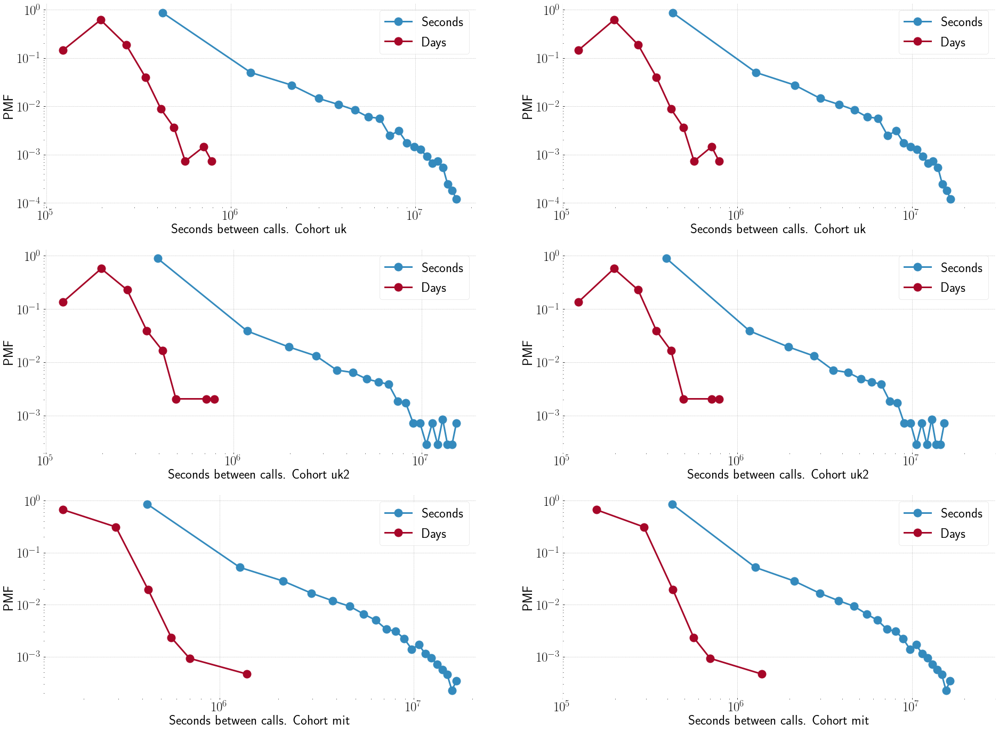

In [73]:
plt.figure(figsize=(32, 24))
p = 1
for c in ['uk', 'uk2', 'mit']:
    for col in ['l', 'r']:
        plt.subplot(3,2,p)
        plt.xlabel(f"Seconds between calls. Cohort {c}")
        plt.ylabel("PMF")
        if col == 'r':
            plt.xlim(10**5, 3*10**7)
        plt.loglog()
        m = 0
        plt.plot(consec_bys[c]['all'][0]['label'] + 1, consec_bys[c]['all'][0]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3, 
                     label=fr'Seconds')
        plt.plot([x * 24 * 3600 for x in consec[c][1]['all'][1]['label'] + 1], consec[c][1]['all'][1]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3, 
                     label=fr'Days')
        plt.legend()
        p += 1

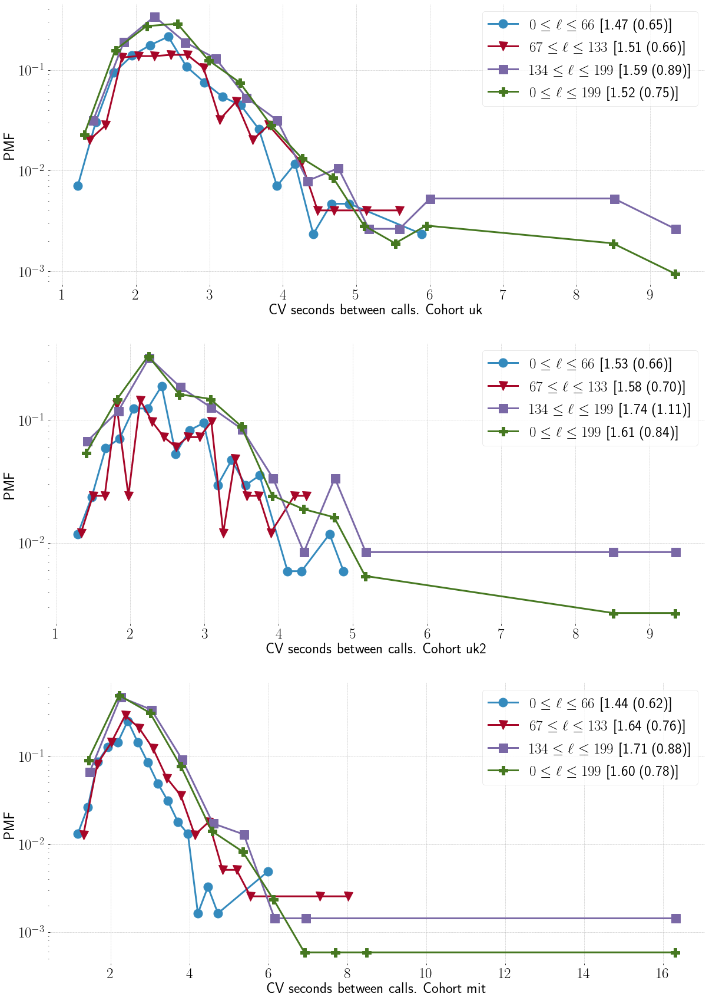

In [74]:
plt.figure(figsize=(20, 30))
p = 1
for c in ['uk', 'uk2', 'mit']:
    plt.subplot(3,1,p)
    plt.xlabel(f"CV seconds between calls. Cohort {c}")
    plt.ylabel("PMF")
#     plt.xlim(10**5, 10**8)
    plt.semilogy()
    m = 0
    for k in consec_bys[c].keys():
        plt.plot(consec_bys[c][k][1]['label'] + 1, consec_bys[c][k][1]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3, 
                 label=fr'${limits[k][0]} \leq \ell \leq {limits[k][1]}$ [{consec_bys[c][k][2]:.2f} ({consec_bys[c][k][3]:.2f})]')
        m += 1
    plt.legend()
    p += 1

### Pick a day

In [75]:
hh = {}
for c in calls.keys():
    df = calls[c].copy(deep=True)
    df['ea'] = list(zip(df['ego'], df['alter']))
    ncalls = df.groupby('ea')[['time']].count()
    ncalls = ncalls.loc[ncalls['time'] > 2]
    df = df[df['ea'].isin(ncalls.index)]
    df['cal_day'] = df['time'].map(lambda x: x.date())
    hh[c] = {}
    hh[c]['calls'] = df.groupby('cal_day')[['aclock']].count().sort_index()
    hh[c]['calls']['calls'] = hh[c]['calls']['aclock'].div(sum(hh[c]['calls']['aclock']))
    hh[c]['pairs'] = df.groupby('cal_day')[['ea']].nunique()
    hh[c]['pairs']['pairs'] = hh[c]['pairs']['ea'].div(sum(hh[c]['pairs']['ea']))

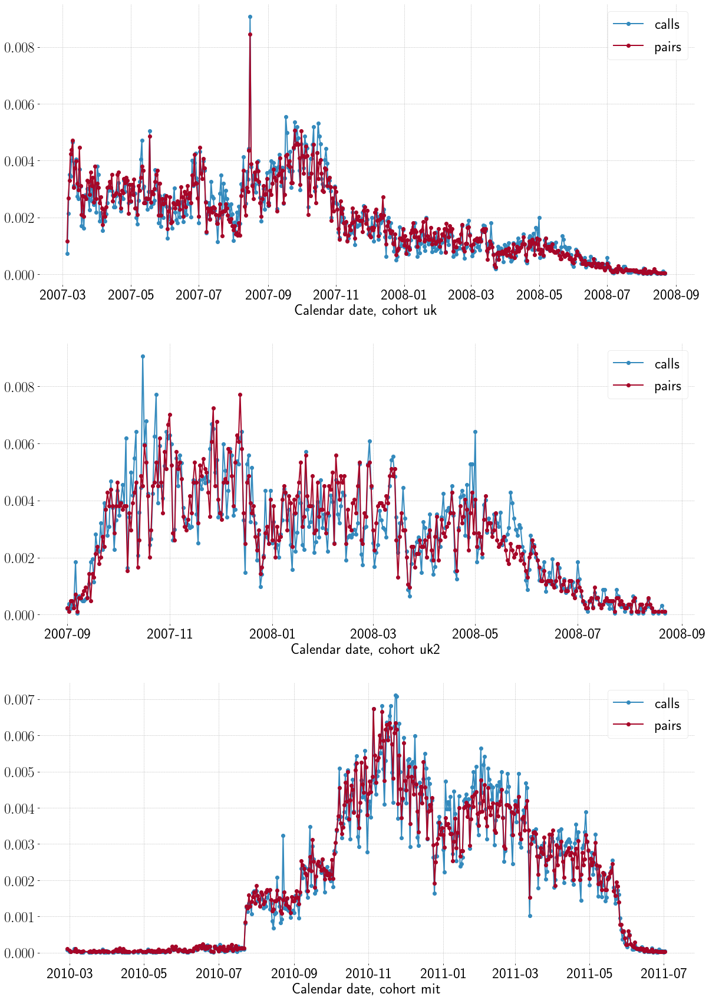

In [76]:
plt.figure(figsize=(20, 30))
p = 1
for c in hh.keys():
    plt.subplot(3, 1, p)
    plt.xlabel(f"Calendar date, cohort {c}")
#     if c == 'uk':
#         plt.xlim(dt.date(2007, 4, 1), dt.date(2007, 5, 31))
#     elif c == 'uk2':
#         plt.xlim(dt.date(2007, 10, 1), dt.date(2007, 11, 30))
#     else:
#         plt.xlim(dt.date(2010, 10, 1), dt.date(2010, 11, 30))
    for v in hh[c].keys():
        plt.plot(hh[c][v].index, hh[c][v][v], "o-", label=f'{v}')
    plt.legend()
    p += 1

In [77]:
days = {}
days['uk'] = (dt.datetime(2007, 4, 27, 17, 0), dt.datetime(2007, 4, 28, 16, 59))
days['uk2'] = (dt.datetime(2007, 10, 4, 17, 0), dt.datetime(2007, 10, 5, 16, 59))
days['mit'] = (dt.datetime(2010, 10, 21, 17, 0), dt.datetime(2010, 10, 22, 16, 59))

In [78]:
calls24h = {}
for c in calls.keys():
    df = calls[c].copy(deep=True)
    df = df.loc[(df['time'] >= days[c][0]) & (df['time'] <= days[c][1])]
    calls24h[c] = calls_by_second(df)

lost 122 pairs
lost 36 pairs
lost 239 pairs


In [79]:
oneday = {}
for c in calls24h.keys():
    oneday[c] = consecutive_bys(calls24h[c], 0, 200, nolives=calls[c])

In [80]:
# for c in oneday.keys():
#     print(f'{c}\nAccepted pairs:\t {oneday[c][4]}\nRejected pairs:\t {oneday[c][5]}')

In [81]:
# for c in calls24h.keys():
#     print(len(calls24h[c]))

In [82]:
# oneday['uk'][0]

In [83]:
# plt.figure(figsize=(20, 30))
# p = 1
# for c in ['uk', 'uk2', 'mit']:
#     plt.subplot(3,1,p)
#     plt.xlabel(f"Seconds between calls. One day in Cohort {c}")
#     plt.ylabel("PMF")
#     plt.loglog()
#     plt.plot(oneday[c][0]['label'] + 1, oneday[c][0]['pmf'], "o-", markersize=15, lw=3)
#     p += 1

In [84]:
# plt.figure(figsize=(20, 30))
# p = 1
# for c in oneday.keys():
#     plt.subplot(3,1,p)
#     plt.xlabel(f'CV seconds between calls. Cohort {c}')
#     plt.plot(oneday[c][1]['label'], oneday[c][1]['pmf'], "o-")
#     p += 1

# An idea to check

In [85]:
def diff_curves(faverages, fiaverages, scaled=True):
    diff = {}
    for ego in fiaverages.keys():
        for efei in range(3):
            for efe in range(3):
                x = faverages[efe]
                if len(fiaverages[ego][efei]) > 0:
                    y = fiaverages[ego][efei]
                    r = min(max(x.index), max(y.index))
                    locsum = 0
                    n = 0
                    for i in range(r):
                        if (i in x.index) and (i in y.index):
                            n += 1
                            locsum += abs(x.at[i, 'f'] - y.at[i, 'f'])**2
                    diff[efei] = diff.get(efei, {})
                    diff[efei][efe] = diff[efei].get(efe, [])
                    if n > 0:
                        if scaled:
                            diff[efei][efe].append((locsum**(1/2)) / n)
                        else:
                            diff[efei][efe].append(locsum**(1/2))
    return diff

In [86]:
f = {}
for c in ['uk', 'uk2', 'mit']:
    f[c] = {}
    for lamb in stablec[c].keys():
        f[c][lamb] = stablec[c][lamb]

In [87]:
t0 = dt.datetime.now()
limits = {}
limits[0] = (0, 50)
limits[1] = (100, 150)
limits[2] = (180, 230)

fi = {}
for c in ['uk', 'uk2', 'mit']:
    fi[c] = {}
    egolist = calls[c]['ego'].unique()
    for ego in egolist:
        fi[c][ego] = {}
        dff = pc.get_f(calls[c], ego, 15, 67)
        for i in limits.keys():
            fi[c][ego][i] = pc.get_avgfa(dff, lives[c], limits[i][0], limits[i][1])
print(f'Took {dt.datetime.now() - t0}')

Took 0:00:20.283512


In [88]:
t0 = dt.datetime.now()
diffc = {}
for c in fi.keys():
    diffc[c] = diff_curves(f[c], fi[c], scaled=True)
print(f'Took {dt.datetime.now() - t0}')

Took 0:00:00.082618


In [89]:
for c in diffc.keys():
    print(f'=============={c}==========')
    for i in diffc[c].keys():
        for j in diffc[c][i].keys():
            print(len(diffc[c][i][j]))

==============uk==========
30
30
30
30
30
30
30
30
30
==============uk2==========
26
26
26
30
30
30
30
30
30
==============mit==========
103
103
103
107
107
107
107
107
107


In [90]:
Hdif = {}
for c in diffc.keys():
    Hdif[c] = {}
    for i in diffc[c].keys():
        Hdif[c][i] = {}
        for j in diffc[c][i].keys():
            Hdif[c][i][j] = pc.histogram(diffc[c][i][j], 10, log=False)

In [91]:
sum(Hdif['uk'][0][0]['h'] * Hdif['uk'][0][0]['label']) / sum(Hdif['uk'][0][0]['h'])

0.1995306971691173

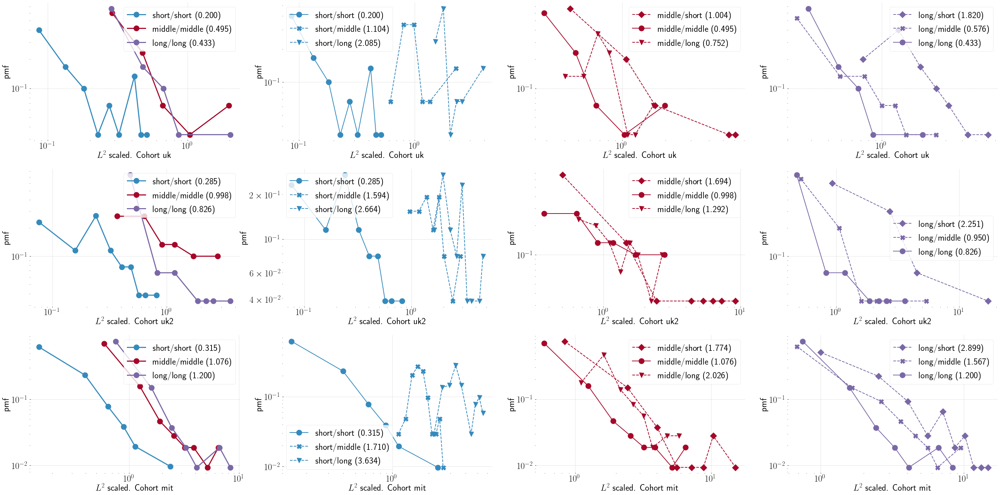

In [92]:
plt.figure(figsize=(48, 24))
mm = ["D", "X", "v"]
p = 1
labs = {0: 'short', 1: 'middle', 2: 'long'}
for c in Hdif.keys():
    plt.subplot(3,4,p)
    plt.loglog()
    plt.xlabel(fr'$L^2$ scaled. Cohort {c}')
    plt.ylabel('pmf')
    for i in range(3):
        mean = sum(Hdif[c][i][i]['h'] * Hdif[c][i][i]['label']) / sum(Hdif[c][i][i]['h'])
        plt.plot(Hdif[c][i][i]['label'], Hdif[c][i][i]['pmf'], marker="o", markersize=15, ls="solid", lw=3, label=f'{labs[i]}/{labs[i]} ({mean:.3f})')
    plt.legend()
    p += 1
    
    plt.subplot(3,4,p)
    plt.loglog()
    plt.xlabel(fr'$L^2$ scaled. Cohort {c}')
    plt.ylabel('pmf')
    for i in range(3):
        mean = sum(Hdif[c][0][i]['h'] * Hdif[c][0][i]['label']) / sum(Hdif[c][0][i]['h'])
        if i == 0:
            plt.plot(Hdif[c][0][i]['label'], Hdif[c][0][i]['pmf'], marker="o", markersize=15, ls="solid", c=colors[0], label=f'{labs[0]}/{labs[i]} ({mean:.3f})')
        else:
            plt.plot(Hdif[c][0][i]['label'], Hdif[c][0][i]['pmf'], marker=mm[i], markersize=13, ls="dashed", c=colors[0], label=f'{labs[0]}/{labs[i]} ({mean:.3f})')
    plt.legend()
    p += 1
    
    plt.subplot(3,4,p)
    plt.loglog()
    plt.xlabel(fr'$L^2$ scaled. Cohort {c}')
    plt.ylabel('pmf')
    for i in range(3):
        mean = sum(Hdif[c][1][i]['h'] * Hdif[c][1][i]['label']) / sum(Hdif[c][1][i]['h'])
        if i == 1:
            plt.plot(Hdif[c][1][i]['label'], Hdif[c][1][i]['pmf'], marker="o", markersize=15, ls="solid", c=colors[1], label=f'{labs[1]}/{labs[i]} ({mean:.3f})')
        else:
            plt.plot(Hdif[c][1][i]['label'], Hdif[c][1][i]['pmf'], marker=mm[i], markersize=13, ls="dashed", c=colors[1], label=f'{labs[1]}/{labs[i]} ({mean:.3f})')
    plt.legend()
    p += 1
    
    plt.subplot(3,4,p)
    plt.loglog()
    plt.xlabel(fr'$L^2$ scaled. Cohort {c}')
    plt.ylabel('pmf')
    for i in range(3):
        mean = sum(Hdif[c][2][i]['h'] * Hdif[c][2][i]['label']) / sum(Hdif[c][2][i]['h'])
        if i == 2:
            plt.plot(Hdif[c][2][i]['label'], Hdif[c][2][i]['pmf'], marker="o", markersize=15, ls="solid", c=colors[2], label=f'{labs[2]}/{labs[i]} ({mean:.3f})')
        else:
            plt.plot(Hdif[c][2][i]['label'], Hdif[c][2][i]['pmf'], marker=mm[i], markersize=13, ls="dashed", c=colors[2], label=f'{labs[2]}/{labs[i]} ({mean:.3f})')
    plt.legend()
    p += 1

In [93]:
Hdif['uk'][0].keys()

dict_keys([0, 1, 2])

In [94]:
f = {}
for lamb in stablec['uk'].keys():
    f[lamb] = stablec['uk'][lamb]
    
egolist = calls['uk']['ego'].unique()

t0 = dt.datetime.now()
fi = {}
for ego in egolist:
    fi[ego] = {}
    dff = pc.get_f(calls['uk'], ego, 15, 67)
    for i in limits.keys():
        fi[ego][i] = pc.get_avgfa(dff, lives['uk'], limits[i][0], limits[i][1])
print(f'Took {dt.datetime.now() - t0}')



Took 0:00:07.774272


In [95]:
limits = {}
limits[0] = (0, 50)
limits[1] = (100, 150)
limits[2] = (180, 230)

t0 = dt.datetime.now()
fi = {}
for ego in egolist:
    fi[ego] = {}
    dff = pc.get_f(calls['uk'], ego, 15, 67)
    for i in limits.keys():
        fi[ego][i] = pc.get_avgfa(dff, lives['uk'], limits[i][0], limits[i][1])
print(f'Took {dt.datetime.now() - t0}')

Took 0:00:07.130107


In [96]:
for lamb in f.keys():
    print(lamb, len(f[lamb]))

0 4
1 11
2 16


In [97]:
samed = {}
for ego in fi.keys():
    for lamb in fi[ego].keys():
        x = f[lamb]
        y = fi[ego][lamb]
        r = min(max(x.index), max(y.index))
        locsum = 0
        n = 0
        for i in range(r):
            if (i in x.index) and (i in y.index):
                locsum += abs(x.at[i, 'f'] - y.at[i, 'f'])**2
        samed[lamb] = samed.get(lamb, [])
        samed[lamb].append(locsum**(1/2))

In [98]:
[x / 3 for x in samed[0]]

[0.0865426319056022,
 0.09370720733820492,
 0.08544483706820788,
 0.13534859054226875,
 0.09326419151087562,
 0.0797139771336136,
 0.07983262095591684,
 0.07608810805205113,
 0.18380368049782583,
 0.41488218456861686,
 0.053445810137816706,
 0.14412659932027752,
 0.16842713393840905,
 0.19363009989599447,
 0.15145329153069814,
 0.16136122525055563,
 0.11079503249674799,
 0.4066050300880096,
 0.2624476597691389,
 0.17329593194065773,
 0.09263457367541035,
 0.06796238942288381,
 0.17808363327731147,
 0.13646306467343047,
 0.06789070234123366,
 0.20056521775499328,
 0.15368473412038833,
 0.24451469981718973,
 0.10527913576513653,
 0.06281399467303715]

In [99]:
[x / 10 for x in samed[1]]

[0.27174194813871366,
 0.22879698125994757,
 0.3470747218456861,
 0.32953670651158473,
 0.261532843005185,
 0.4466334927072073,
 0.24946902170813448,
 0.5527484679133978,
 0.31123308578004855,
 0.2678431199545666,
 0.8604595107281522,
 0.40222677152053504,
 0.3074168192755045,
 0.2258152173884307,
 0.3247171782910161,
 0.33086879674636116,
 0.23832983508019967,
 1.7315658403679648,
 0.2630991669673461,
 0.20965639301499786,
 0.3556773455103118,
 0.21569099623749008,
 0.3093599918709008,
 0.2683579436197332,
 0.2194806410581705,
 0.17566958091721988,
 0.3068993421790768,
 1.8612740891675028,
 0.32755756955662296,
 0.27637988633714483]

In [100]:
[x / 15 for x in samed[2]]

[0.33493530491836143,
 0.3087800198891765,
 0.18856875275358476,
 0.5570797504461528,
 0.36355296138040794,
 0.32645846299623044,
 0.3716217652001223,
 0.6090046093581534,
 0.2505140201526419,
 0.7624334659529066,
 0.37220498727567,
 0.3533118180627845,
 0.35684987458309614,
 0.38822911046770125,
 0.2721546959173031,
 0.3908294604555787,
 0.3166972777977978,
 0.6439746901725958,
 0.8116323432535365,
 2.1161321772335646,
 0.2299695452806653,
 0.4673646234165664,
 0.43138538800145615,
 0.26465705560704633,
 0.19238987897050108,
 0.3072110975338467,
 0.24823479383627797,
 0.3270651059296477,
 0.28244580955748855,
 0.316594335079397]

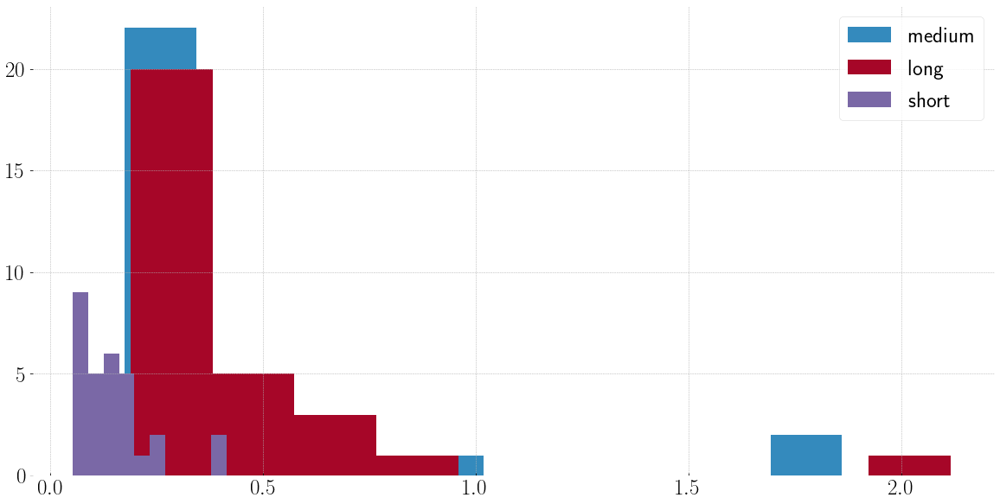

In [101]:
plt.hist([x / 10 for x in samed[1]], bins=10, label='medium')
plt.hist([x / 15 for x in samed[2]], bins=10, label='long')
plt.hist([x / 3 for x in samed[0]], bins=10, label='short')
plt.legend()

In [102]:
Hs = {}
for lamb in samed.keys():
    Hs[lamb] = pc.histogram(samed[lamb], 10, log=True)

In [103]:
for i in f.keys():
    print(i, len(f[i]))

0 4
1 11
2 16


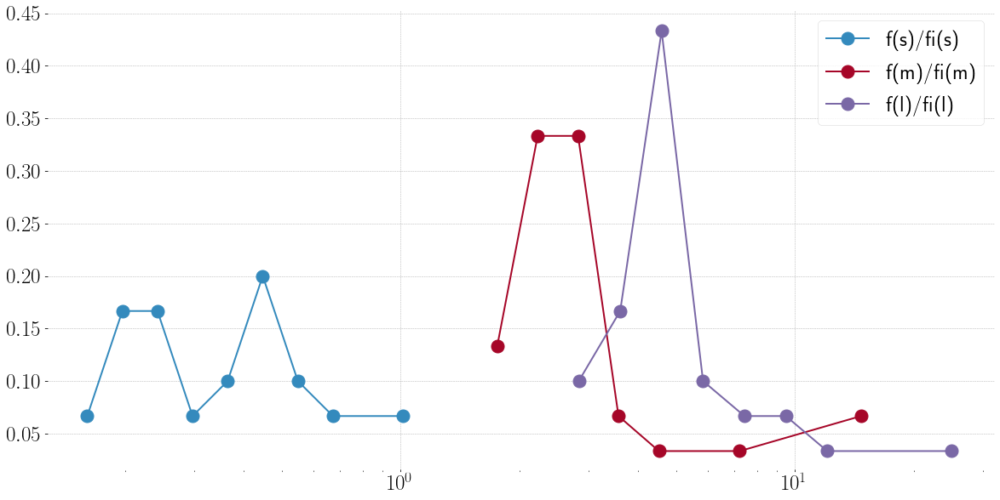

In [104]:
labels = ['f(s)/fi(s)', 'f(m)/fi(m)', 'f(l)/fi(l)']
plt.semilogx()
plt.plot([x / 1 for x in Hs[0]['label']], [y * 1 for y in Hs[0]['pmf']], marker="o", markersize=15, ls="solid", lw=2, label=labels[0])
plt.plot([x / 1 for x in Hs[1]['label']], [y * 1 for y in Hs[1]['pmf']], marker="o", markersize=15, ls="solid", lw=2, label=labels[1])
plt.plot([x / 1 for x in Hs[2]['label']], [y * 1 for y in Hs[2]['pmf']], marker="o", markersize=15, ls="solid", lw=2, label=labels[2])
plt.legend()

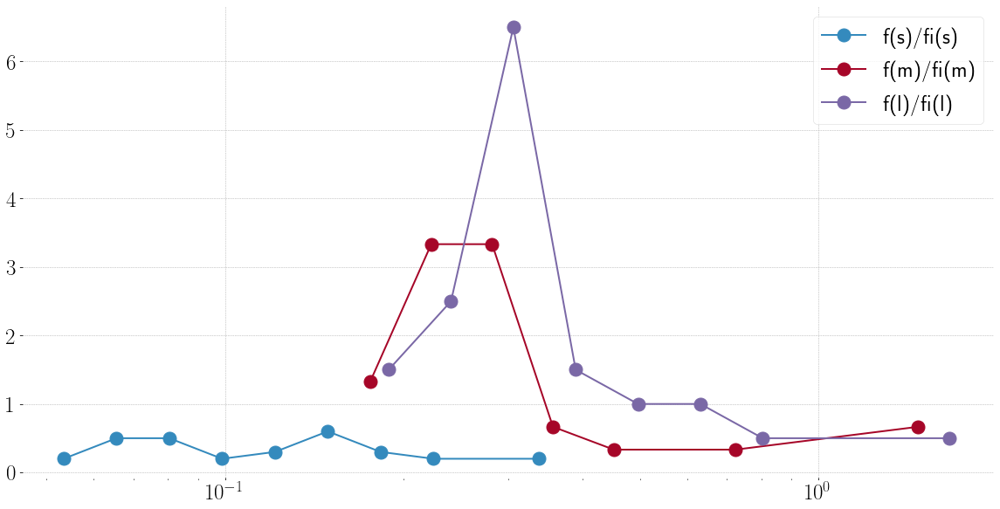

In [105]:
labels = ['f(s)/fi(s)', 'f(m)/fi(m)', 'f(l)/fi(l)']
plt.semilogx()
plt.plot([x / 3 for x in Hs[0]['label']], [y * 3 for y in Hs[0]['pmf']], marker="o", markersize=15, ls="solid", lw=2, label=labels[0])
plt.plot([x / 10 for x in Hs[1]['label']], [y * 10 for y in Hs[1]['pmf']], marker="o", markersize=15, ls="solid", lw=2, label=labels[1])
plt.plot([x / 15 for x in Hs[2]['label']], [y * 15 for y in Hs[2]['pmf']], marker="o", markersize=15, ls="solid", lw=2, label=labels[2])
plt.legend()

In [106]:
sum([x * 5 for x in Hs[0]['pmf']])

4.999999999999999

In [107]:
diffd = {}
for ego in fi.keys():
    for efei in [0, 1, 2]:
        for efe in [0, 1, 2]:
            if efei != efe:
                x = f[efe]
                y = fi[ego][efei]
                r = min(max(x.index), max(y.index))
                locsum = 0
                for i in range(r):
                    if (i in x.index) and (i in y.index):
                        locsum += abs(x.at[i, 'f'] - y.at[i, 'f'])**2
                diffd[efei] = diffd.get(efei, {})
                diffd[efei][efe] = diffd[efei].get(efe, [])
                diffd[efei][efe].append(locsum)

In [108]:
Hd = {}
for efei in diffd.keys():
    Hd[efei] = {}
    for efe in diffd[efei].keys():
        Hd[efei][efe] = pc.histogram(diffd[efei][efe], 10, log=True)

In [109]:
f[0]

,f
0,1.918866
1,0.192404
2,0.109865
3,0.062936


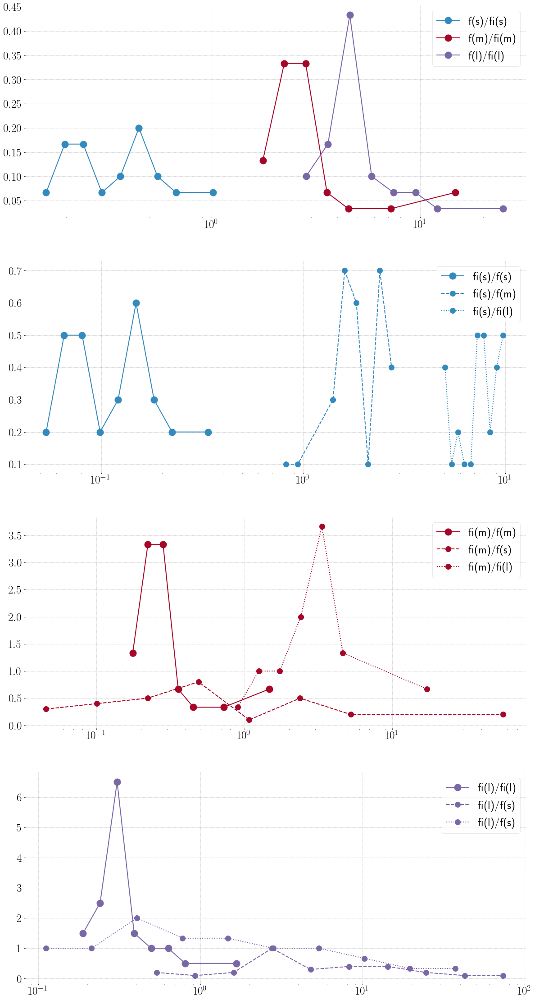

In [110]:
plt.figure(figsize=(20, 40))

plt.subplot(4, 1, 1)
plt.semilogx()
labels = ['f(s)/fi(s)', 'f(m)/fi(m)', 'f(l)/fi(l)']
for k in Hs.keys():
    plt.plot(Hs[k]['label'], Hs[k]['pmf'], marker="o", markersize=15, ls="solid", lw=2, label=labels[k])
plt.legend()


plt.subplot(4, 1, 2)
plt.semilogx()
lines = ['solid', 'dashed', 'dotted']
labels = ['fi(s)/f(s)', 'fi(s)/f(m)', 'fi(s)/fi(l)']
plt.plot([x / 3 for x in Hs[0]['label']], [y * 3 for y in  Hs[0]['pmf']], marker="o", markersize=15, ls=lines[0], lw=2, c=colors[0], label=labels[0])
for k in [1,2]:
    plt.plot([x / 3 for x in Hd[0][k]['label']], [y * 3 for y in Hd[0][k]['pmf']], marker="o", markersize=12, ls=lines[k], c=colors[0], lw=2, label=labels[k])
plt.legend()

plt.subplot(4, 1, 3)
plt.semilogx()
lines = ['dashed', 'solid', 'dotted']
labels = ['fi(m)/f(s)', 'fi(m)/f(m)', 'fi(m)/fi(l)']
plt.plot([x / 10 for x in Hs[1]['label']], [y * 10 for y in Hs[1]['pmf']], marker="o", markersize=15, ls=lines[1], lw=2, c=colors[1], label=labels[1])
plt.plot([x / 3 for x in Hd[1][0]['label']], [y * 3 for y in Hd[1][0]['pmf']], marker="o", markersize=12, ls=lines[0], c=colors[1], lw=2, label=labels[0])
plt.plot([x / 10 for x in Hd[1][2]['label']], [y * 10 for y in Hd[1][2]['pmf']], marker="o", markersize=12, ls=lines[2], c=colors[1], lw=2, label=labels[2])
plt.legend()

plt.subplot(4, 1, 4)
plt.semilogx()
lines = ['dashed', 'dotted', 'solid']
labels = ['fi(l)/f(s)', 'fi(l)/f(m)', 'fi(l)/fi(l)']
plt.plot([x / 15 for x in Hs[2]['label']], [y * 15 for y in Hs[2]['pmf']], marker="o", markersize=15, ls=lines[2], lw=2, c=colors[2], label=labels[2])
plt.plot([x / 3 for x in Hd[2][0]['label']], [y * 3 for y in Hd[2][0]['pmf']], marker="o", markersize=12, ls=lines[0], c=colors[2], lw=2, label=labels[0])
plt.plot([x / 10 for x in Hd[2][1]['label']], [y * 10 for y in Hd[2][1]['pmf']], marker="o", markersize=12, ls=lines[1], c=colors[2], lw=2, label=labels[0])
plt.legend()

In [111]:
Hsl = {}
for lamb in samed.keys():
    Hsl[lamb] = pc.histogram(samed[lamb], 10, log=False)
Hdl = {}
for efei in diffd.keys():
    Hdl[efei] = {}
    for efe in diffd[efei].keys():
        Hdl[efei][efe] = pc.histogram(diffd[efei][efe], 10, log=False)

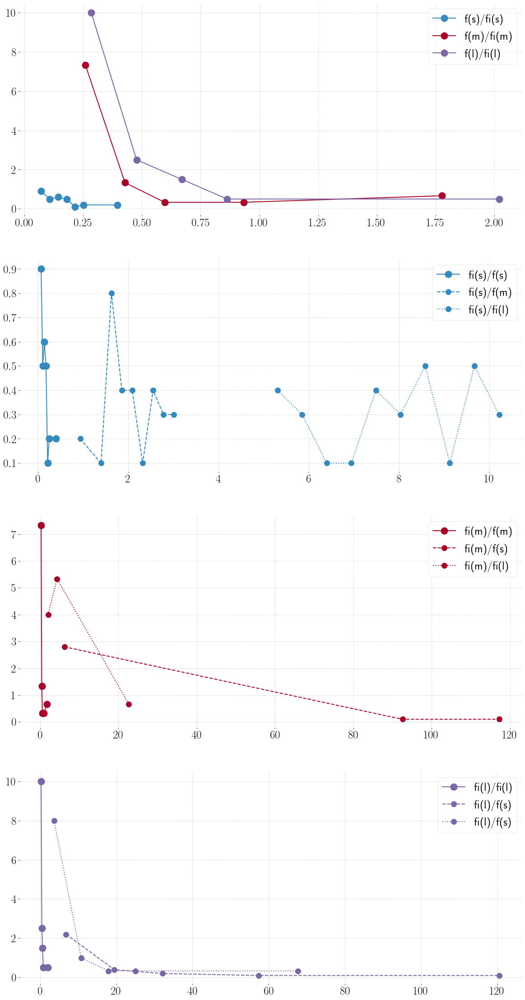

In [112]:
plt.figure(figsize=(20, 40))

plt.subplot(4, 1, 1)
# plt.semilogx()
labels = ['f(s)/fi(s)', 'f(m)/fi(m)', 'f(l)/fi(l)']
plt.plot([x / 3 for x in Hsl[0]['label']], [y * 3 for y in Hsl[0]['pmf']], marker="o", markersize=15, ls="solid", lw=2, label=labels[0])
plt.plot([x / 10 for x in Hsl[1]['label']], [y * 10 for y in Hsl[1]['pmf']], marker="o", markersize=15, ls="solid", lw=2, label=labels[1])
plt.plot([x / 15 for x in Hsl[2]['label']], [y * 15 for y in Hsl[2]['pmf']], marker="o", markersize=15, ls="solid", lw=2, label=labels[2])
plt.legend()


plt.subplot(4, 1, 2)
# plt.semilogx()
lines = ['solid', 'dashed', 'dotted']
labels = ['fi(s)/f(s)', 'fi(s)/f(m)', 'fi(s)/fi(l)']
plt.plot([x / 3 for x in Hsl[0]['label']], [y * 3 for y in  Hsl[0]['pmf']], marker="o", markersize=15, ls=lines[0], lw=2, c=colors[0], label=labels[0])
for k in [1,2]:
    plt.plot([x / 3 for x in Hdl[0][k]['label']], [y * 3 for y in Hdl[0][k]['pmf']], marker="o", markersize=12, ls=lines[k], c=colors[0], lw=2, label=labels[k])
plt.legend()

plt.subplot(4, 1, 3)
# plt.semilogx()
lines = ['dashed', 'solid', 'dotted']
labels = ['fi(m)/f(s)', 'fi(m)/f(m)', 'fi(m)/fi(l)']
plt.plot([x / 10 for x in Hsl[1]['label']], [y * 10 for y in Hsl[1]['pmf']], marker="o", markersize=15, ls=lines[1], lw=2, c=colors[1], label=labels[1])
plt.plot([x / 3 for x in Hdl[1][0]['label']], [y * 3 for y in Hdl[1][0]['pmf']], marker="o", markersize=12, ls=lines[0], c=colors[1], lw=2, label=labels[0])
plt.plot([x / 10 for x in Hdl[1][2]['label']], [y * 10 for y in Hdl[1][2]['pmf']], marker="o", markersize=12, ls=lines[2], c=colors[1], lw=2, label=labels[2])
plt.legend()

plt.subplot(4, 1, 4)
# plt.semilogx()
lines = ['dashed', 'dotted', 'solid']
labels = ['fi(l)/f(s)', 'fi(l)/f(m)', 'fi(l)/fi(l)']
plt.plot([x / 15 for x in Hsl[2]['label']], [y * 15 for y in Hsl[2]['pmf']], marker="o", markersize=15, ls=lines[2], lw=2, c=colors[2], label=labels[2])
plt.plot([x / 3 for x in Hdl[2][0]['label']], [y * 3 for y in Hdl[2][0]['pmf']], marker="o", markersize=12, ls=lines[0], c=colors[2], lw=2, label=labels[0])
plt.plot([x / 10 for x in Hdl[2][1]['label']], [y * 10 for y in Hdl[2][1]['pmf']], marker="o", markersize=12, ls=lines[1], c=colors[2], lw=2, label=labels[0])
plt.legend()

# $f_i$ compared to $f$

In [113]:
calls251 = {}
for c in ['uk', 'mit']:
    calls251[c] = pc.limit_calls(unfiltered[c], 251)

dfftmp = {}
dfftmp['all'] = {}
for c in calls251.keys():
    dfftmp[c] = pc.get_f(calls251[c], 'all', 15, 67)
    dfftmp['all'].update(dfftmp[c])

lives251 = {}
lives251['all'] = {}
for c in calls251.keys():
    lives251[c] = pc.lives_dictionary(calls251[c])
    lives251['all'].update(lives251[c])

    
limits = {}
limits[0] = (0, 50)
limits[1] = (100, 150)
limits[2] = (200, 250)


f = {}
for i in limits.keys():
    f[i] = pc.get_avgfa(dfftmp['all'], lives251['all'], limits[i][0], limits[i][1])

In [114]:
fi = {}
for c in ['uk', 'mit']:
    egolist = calls251[c]['ego'].unique()
    for ego in egolist:
        fi[ego] = {}
        dff = pc.get_f(calls251[c], ego, 15, 67)
        for i in limits.keys():
            fi[ego][i] = pc.get_avgfa(dff, lives251[c], limits[i][0], limits[i][1])

{2: 'C07800755987', 1: 'C07791428359', 0: 'C07974937643'} 	 {2: 'sp10-01-07', 1: 'sp10-01-07', 0: 'sp10-01-52'}


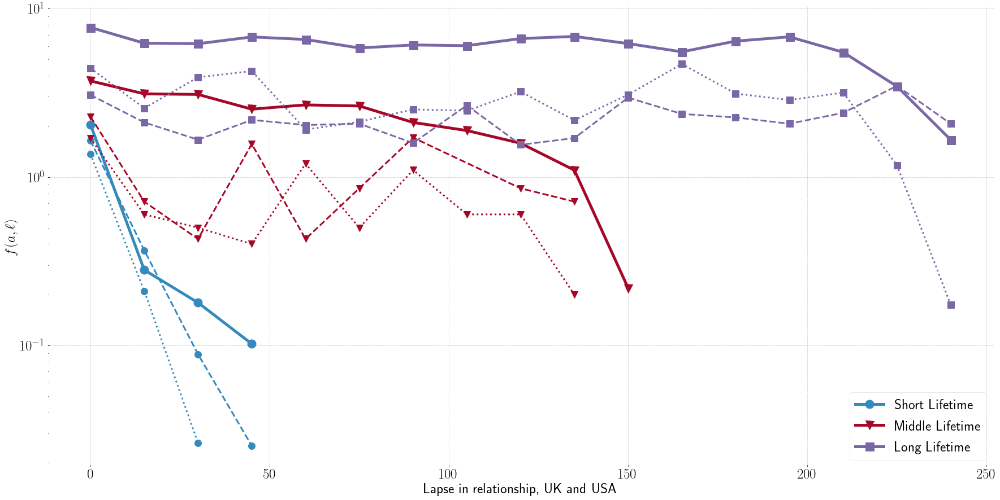

In [115]:
# np.random.seed(41)
egosuk = {2: 'C07800755987', 1: 'C07791428359', 0: 'C07974937643'}
egosus = {2: 'sp10-01-07', 1: 'sp10-01-07', 0: 'sp10-01-52'}
# egosuk = {i: np.random.choice(calls251['uk']['ego'].unique()) for i in range(3)}
# egosus = {i: np.random.choice(calls251['mit']['ego'].unique()) for i in range(3)}
labels = ['Short Lifetime', 'Middle Lifetime', 'Long Lifetime']
plt.figure(figsize=(30, 15))
plt.xlabel("Lapse in relationship, UK and USA")
plt.ylabel(r"$f(a, \ell)$")
plt.semilogy()
print(egosuk, '\t',  egosus)
for i in range(3):
    plt.plot([x * 15 for x in f[i].index], f[i]['f'], marker=markers[i], markersize=15, ls="solid", lw=5, c=colors[i], label=labels[i])
    plt.plot([x * 15 for x in fi[egosuk[i]][i].index], fi[egosuk[i]][i]['f'], marker=markers[i], markersize=12, ls="dashed", lw=3, c=colors[i])
    plt.plot([x * 15 for x in fi[egosus[i]][i].index], fi[egosus[i]][i]['f'], marker=markers[i], markersize=12, ls="dotted", lw=3, c=colors[i])
plt.legend()

In [116]:
# tmp = pd.DataFrame(index=list(f[2].index))
# for i in range(3):
#     df = f[i].copy(deep=True).rename({'f': f'avg{i}'}, axis='columns')
#     tmp = tmp.merge(df, left_index=True, right_index=True, how='outer')
#     df1 = fi[egosuk[i]][i].copy(deep=True).rename({'f': f'e1_{i}'}, axis='columns')
#     tmp = tmp.merge(df1, left_index=True, right_index=True, how='outer')
#     df2 = fi[egosus[i]][i].copy(deep=True).rename({'f': f'e2_{i}'}, axis='columns')
#     tmp = tmp.merge(df2, left_index=True, right_index=True, how='outer')
# tmp = tmp.loc[tmp.index < 16]
# tmp = tmp.fillna('nan')
# tmp.index = [x*15 for x in tmp.index]
# tmp.index.names = ['a']
# tmp.to_csv(f"../commpatterns/PNAS_paper/figs/fig1.dat", header=True, index=True, sep="\t")

In [117]:
tmp

,x0,y0,x1,y1,x3,y3,xall,yall
0,0.547723,0.003625,0.556488,0.007252,0.483267,0.00377,0.483267,0.001935
1,0.630680,0.017607,0.635301,0.034083,0.580327,0.02531,0.580327,0.014515
2,0.713637,0.040394,0.714115,0.050761,0.677388,0.072698,0.677388,0.059028
3,0.796595,0.027447,0.792928,0.053662,0.774448,0.073775,0.774448,0.059222
4,0.879552,0.027965,0.871742,0.062364,0.871509,0.091007,0.871509,0.062512
5,0.962510,0.674780,0.950555,0.431472,0.968569,0.314486,0.968569,0.489452
6,1.045467,0.032626,1.029368,0.059463,1.065629,0.085622,1.065629,0.060964
7,1.128425,0.023822,1.108182,0.052937,1.16269,0.084006,1.16269,0.057867
8,1.211382,0.024340,1.186995,0.050036,1.25975,0.05762,1.25975,0.048578
9,1.294339,0.026411,1.265809,0.055838,1.356811,0.06462,1.356811,0.068705


In [118]:
a = f[2].copy(deep=True).rename({'f': f'avg2'}, axis='columns')
a

,avg2
0,7.736535
1,6.241785
2,6.194969
3,6.795748
4,6.566701
5,5.845662
6,6.090387
7,6.032379
8,6.646029
9,6.844857


# Different values of $T$

In [119]:
t0 = dt.datetime.now()

callsT = {}
for c in ['uk', 'uk2', 'mit']:
    callsT[c] = {}
    for T in [10, 30, 60, 90]:
        callsT[c][T] = pc.limit_calls(unfiltered[c], 250 + T)
        df = callsT[c][T].groupby(['ego', 'alter'])[['time']].count()
        print(c, T, len(df))
        
dffT = {}
for c in callsT.keys():
    dffT[c] = {}
    for T in callsT[c].keys():
        dffT[c][T] = pc.get_f(callsT[c][T], 'all', 15, 67)

livesT = {}
for c in callsT.keys():
    livesT[c] = {}
    for T in callsT[c].keys():
        livesT[c][T] = pc.lives_dictionary(callsT[c][T])
    
limits = {}
limits[0] = (0, 50)
limits[1] = (100, 150)
limits[2] = (200, 250)


f = {}
for c in dffT.keys():
    f[c] = {}
    for T in dffT[c].keys():
        f[c][T] = {}
        for i in limits.keys():
            f[c][T][i] = pc.get_avgfa(dffT[c][T], livesT[c][T], limits[i][0], limits[i][1])
            
print(f'Took {dt.datetime.now() - t0}')

uk 10 4304
uk 30 4053
uk 60 3685
uk 90 3235
uk2 10 1416
uk2 30 1169
uk2 60 799
uk2 90 350
mit 10 4080
mit 30 2673
mit 60 1566
mit 90 801
Took 0:00:49.949823


In [120]:
len(unfiltered['mit'].groupby(['ego', 'alter'])[['time']].count())

15280

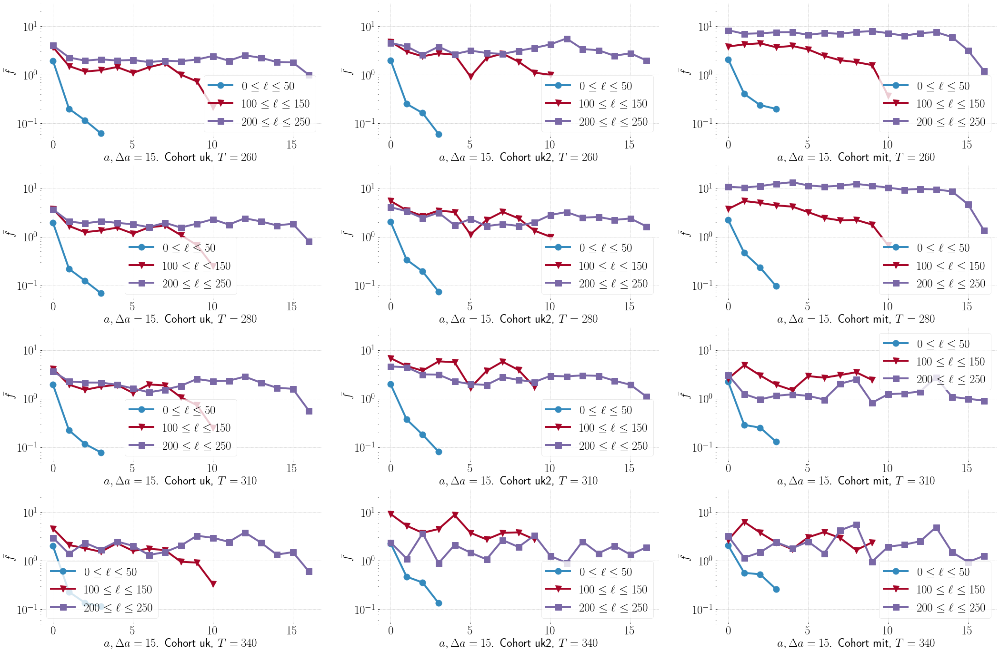

In [121]:
plt.figure(figsize=(12*3, 6*4))
p = 1
for T in [10, 30, 60, 90]:
    for c in ['uk', 'uk2', 'mit']:
        plt.subplot(4,3,p)
        plt.ylim(5* 10**(-2), 3* 10)
        plt.xlabel(fr"$a, \Delta a  = 15$. Cohort {c}, $T = {250 + T}$")
        plt.ylabel(r"$\bar{f}$")
        plt.semilogy()
        for i in range(3):
            plt.plot(f[c][T][i].index, f[c][T][i]['f'], marker=markers[i], markersize=13, ls="solid", lw=4, label=fr'${limits[i][0]} \leq \ell \leq {limits[i][1]}$')
        plt.legend()
        p += 1

In [122]:
callsT['uk'].keys()

dict_keys([10, 30, 60, 90])

# Back to CV
This time they are going to be computed in second. The only difference is that I will treat all alters of the same ego in the same interval $\lambda$ as being the same alter.

In [123]:
limits

{0: (0, 50), 1: (100, 150), 2: (200, 250)}

In [124]:
t0 = dt.datetime.now()
lessalters = {}
for c in calls.keys():
    lessalters[c] = pd.DataFrame()
    df = calls[c].copy(deep = True)
    df['ea'] = list(zip(df['ego'], df['alter']))
    lf = df.groupby('ea')[['aclock']].max()
    for i in limits:
        lf1 = lf.loc[(lf['aclock'] >= limits[i][0]) & (lf['aclock'] <= limits[i][1])]
        df1 = df[df['ea'].isin(lf1.index)]
        for ego in df1['ego'].unique():
            df2 = df1.loc[df1['ego'] == ego]
            df3 = df2.copy()
            df3['alter'] = f'lambda{i}'
            lessalters[c] = lessalters[c].append(df3).reset_index(drop=True)
    lessalters[c] = lessalters[c].sort_values(by=['ego', 'alter', 'time']).reset_index(drop=True)
print(f'Took {dt.datetime.now() - t0}')

Took 0:00:01.768884


In [125]:
for c in calls.keys():
    a = len(calls[c])
    b = len(lessalters[c])
    print(c, a, b)

uk 62306 51560
uk2 19749 14938
mit 122615 104263


In [126]:
la_bys = {}
for c in lessalters.keys():
    la_bys[c] = calls_by_second(lessalters[c])

lost 0 pairs
lost 1 pairs
lost 6 pairs


In [127]:
laH = {}
for c in la_bys.keys():
    laH[c] = {}
    for i in limits.keys():
        laH[c][i] = consecutive_bys(la_bys[c], limits[i][0], limits[i][1])

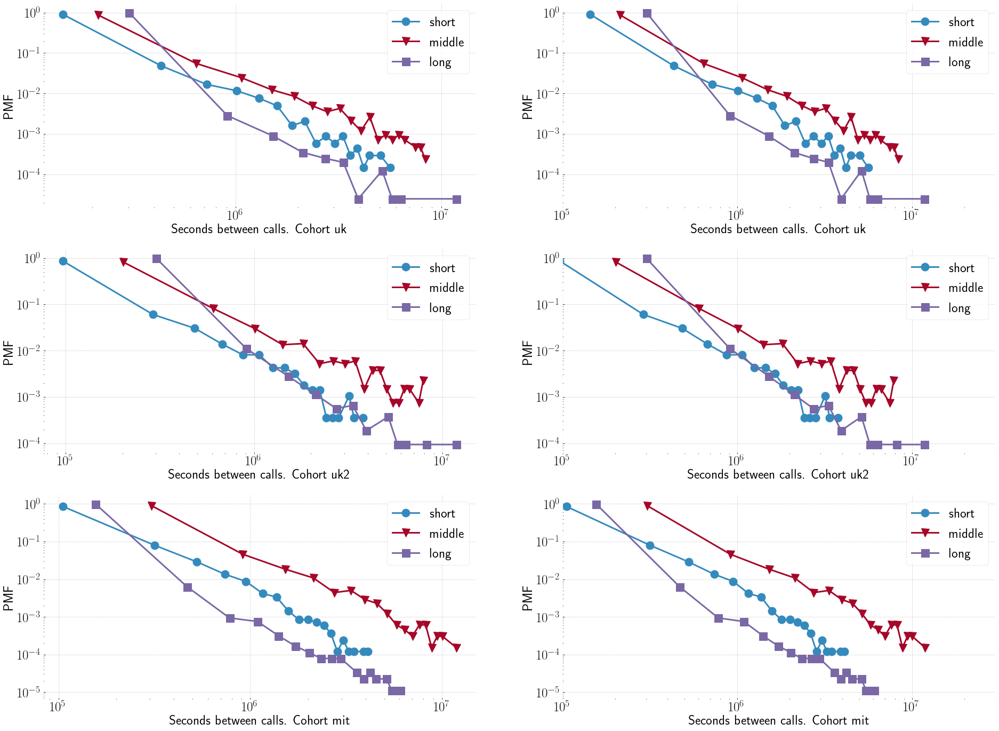

In [128]:
plt.figure(figsize=(32, 24))
p = 1
labs = ['short', 'middle', 'long']
for c in ['uk', 'uk2', 'mit']:
    for col in ['l', 'r']:
        plt.subplot(3,2,p)
        plt.xlabel(f"Seconds between calls. Cohort {c}")
        plt.ylabel("PMF")
        if col == 'r':
            plt.xlim(10**5, 3*10**7)
        plt.loglog()
        for i in laH[c].keys():
            plt.plot(laH[c][i][0]['label'] + 1, laH[c][i][0]['pmf'], marker=markers[i], ls="-", markersize=15, lw=3, label=fr'{labs[i]}')
        plt.legend()
        p += 1

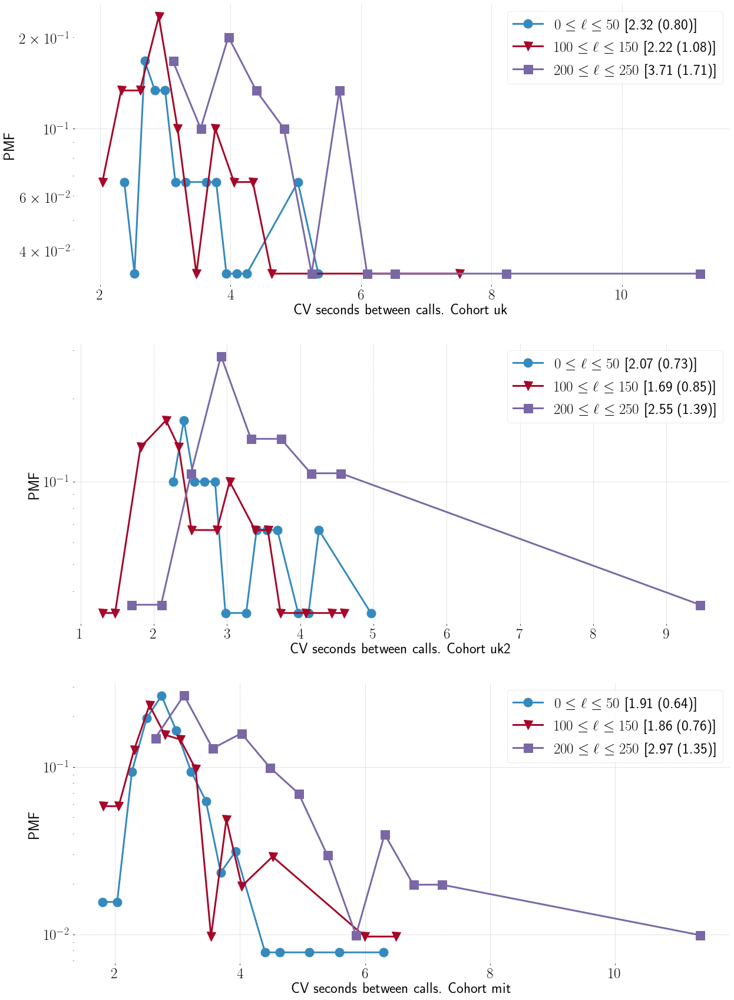

In [129]:
plt.figure(figsize=(20, 30))
p = 1
for c in ['uk', 'uk2', 'mit']:
    plt.subplot(3,1,p)
    plt.xlabel(f"CV seconds between calls. Cohort {c}")
    plt.ylabel("PMF")
    plt.semilogy()
    m = 0
    for k in laH[c].keys():
        plt.plot(laH[c][k][1]['label'] + 1, laH[c][k][1]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3, 
                 label=fr'${limits[k][0]} \leq \ell \leq {limits[k][1]}$ [{laH[c][k][2]:.2f} ({laH[c][k][3]:.2f})]')
        m += 1
    plt.legend()
    p += 1

In [130]:
normalters = {}
for c in lessalters.keys():
    df = calls[c].copy()
    df['ea'] = list(zip(df['ego'], df['alter']))
    df = df[df['ea'].isin(lessalters[c]['ea'].unique())]
    normalters[c] = df

In [131]:
for c in normalters.keys():
    if len(normalters[c]) == len(lessalters[c]):
        print(c, 'success')

uk success
uk2 success
mit success


In [132]:
for c in normalters.keys():
    print(len(normalters[c]))

51560
14938
104263


In [133]:
na_bys = {}
for c in normalters.keys():
    na_bys[c] = calls_by_second(normalters[c])

naH = {}
for c in na_bys.keys():
    naH[c] = {}
    for i in limits.keys():
        naH[c][i] = consecutive_bys(na_bys[c], limits[i][0], limits[i][1])

lost 2768 pairs
lost 1116 pairs
lost 3275 pairs


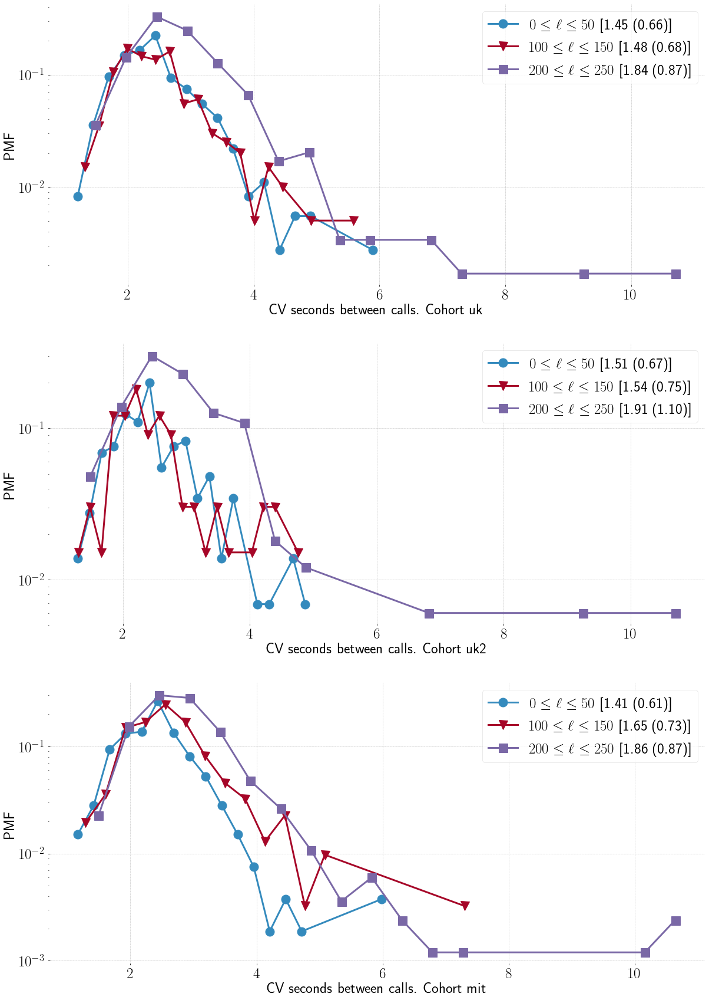

In [134]:
plt.figure(figsize=(20, 30))
p = 1
for c in ['uk', 'uk2', 'mit']:
    plt.subplot(3,1,p)
    plt.xlabel(f"CV seconds between calls. Cohort {c}")
    plt.ylabel("PMF")
    plt.semilogy()
    m = 0
    for k in naH[c].keys():
        plt.plot(naH[c][k][1]['label'] + 1, naH[c][k][1]['pmf'], marker=markers[m], ls="-", markersize=15, lw=3, 
                 label=fr'${limits[k][0]} \leq \ell \leq {limits[k][1]}$ [{naH[c][k][2]:.2f} ({naH[c][k][3]:.2f})]')
        m += 1
    plt.legend()
    p += 1

# $f(t, \ell)$

In [135]:
def get_ftl(calls, ello, ellf, bint):
    df = calls.copy(deep=True)
    df['ea'] = list(zip(df['ego'], df['alter']))
    lf = df.groupby('ea')[['aclock']].max()
    lf = lf.loc[(lf['aclock'] >= ello) & (lf['aclock'] <= ellf)]
    df = df[df['ea'].isin(lf.index)]
    fi = {}
    maxt = 0
    for ego in df['ego'].unique():
        df1 = df.loc[df['ego'] == ego]
        minT = min(df1['time'])
        df2 = df1.copy()
        df2['t'] = (df1['time'] - minT).dt.days
        df3 = df2.copy()
        df3['t'] = df2['t'] // bint
        callsdays = df3.groupby('t')[['time']].count().rename({'time': 'f'}, axis='columns')
        callsdays['f'] /= len(df3['alter'].unique())
        callsdays = callsdays.sort_index()
        if max(callsdays.index) > maxt:
            maxt = max(callsdays.index)
        fi[ego] = callsdays
    
    tmp = {}
    for ego in fi.keys():
        for i in fi[ego].index:
            tmp[i] = tmp.get(i, [])
            tmp[i].append(fi[ego].at[i, 'f'])
            
    tmp2 = {}
    for i in tmp.keys():
        tmp2[i] = np.nanmean(tmp[i])
        
    f = pd.DataFrame.from_dict(tmp2, orient='index')
    f = f.sort_index()
    return {'f': f, 'fi': fi}

In [136]:
limits = {}
limits[0] = (0, 50)
limits[1] = (100, 150)
limits[2] = (200, 250)

fial = {}
for c in ['uk', 'uk2', 'mit']:
    fial[c] = {}
    egolist = callsT[c][60]['ego'].unique()
    for ego in egolist:
        fial[c][ego] = {}
        dff = pc.get_f(callsT[c][60], ego, 15, 67)
        for i in limits.keys():
            fial[c][ego][i] = pc.get_avgfa(dff, livesT[c][60], limits[i][0], limits[i][1])

In [137]:
t0 = dt.datetime.now()
ftl = {}
for c in ['uk', 'uk2', 'mit']:
    ftl[c] = {}
    for i in limits.keys():
        ftl[c][i] = get_ftl(callsT[c][60], limits[i][0], limits[i][1], 15)
print(f'Took {dt.datetime.now() - t0}')

Took 0:00:00.879765


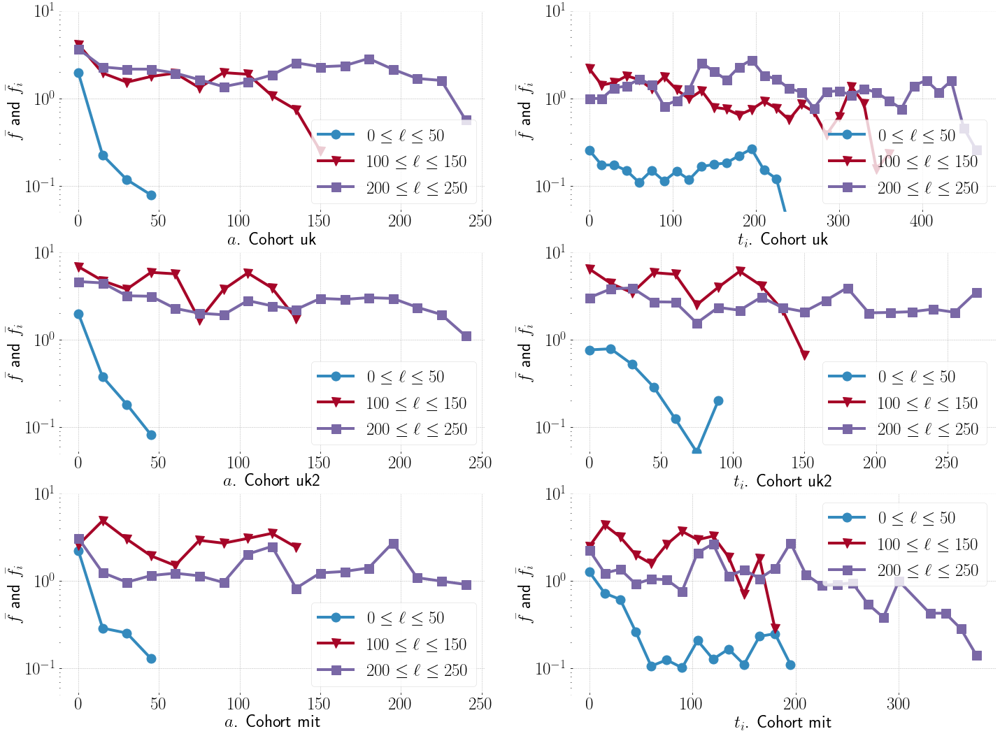

In [138]:
plt.figure(figsize=(2*12, 3*6))
p = 1
for c in ['uk', 'uk2', 'mit']:
    plt.subplot(3,2,p)
    plt.ylim(5*10**(-2), 10)
    plt.xlabel(fr'$a$. Cohort {c}')
    plt.ylabel(r'$\bar{f}$ and $\bar{f}_i$')
    plt.semilogy()
    for i in range(3):
        plt.plot([x * 15 for x in f[c][60][i].index], f[c][60][i]['f'], marker=markers[i], markersize=13, ls="solid", lw=4, c=colors[i], label=fr'${limits[i][0]} \leq \ell \leq {limits[i][1]}$')
#         egos = np.random.choice(list(fial[c].keys()), size=2)
#         for e in egos:
#             plt.plot([x * 15 for x in fial[c][e][i].index], fial[c][e][i]['f'], marker=markers[i], markersize=13, ls="dashed", lw=2, c=colors[i])
    p += 1
    plt.legend()
    
    plt.subplot(3,2,p)
    plt.ylim(5*10**(-2), 10)
    plt.xlabel(fr'$t_i$. Cohort {c}')
    plt.ylabel(r'$\bar{f}$ and $\bar{f}_i$')
    plt.semilogy()
    for i in range(3):
        plt.plot([x * 15 for x in ftl[c][i]['f'].index], ftl[c][i]['f'][0], marker=markers[i], markersize=13, ls="solid", lw=4, c=colors[i], label=fr'${limits[i][0]} \leq \ell \leq {limits[i][1]}$')
#         egos = np.random.choice(list(ftl[c][i]['fi'].keys()), size=2)
#         for e in egos:
#             plt.plot([x * 15 for x in ftl[c][i]['fi'][e].index], ftl[c][i]['fi'][e]['f'], marker=markers[i], markersize=13, ls="dashed", lw=2, c=colors[i])
    p += 1
    plt.legend()

In [139]:
ftl['uk'][0]['f']

,0
0,0.254826
1,0.171981
2,0.173022
3,0.148443
4,0.108839
5,0.149937
6,0.112773
7,0.146985
8,0.117209
9,0.165465


# $P(\tau)$

We define $P(\tau | \ell)$ as the probability of a specific inter prone call time $\tau$, given lifetime $\ell$. This considers the strategy of assuming all alters with lifetime $\ell$ are **the same alter**. We call $P(\tau)$ the probability of getting an inter phone call time of $\tau$, **distinguishing among alters**.

This results should be in agreement with

$$P(\tau) = \sum\limits_{\ell} \left[P(\tau | \ell)P(\ell)\right]$$

In [140]:
limits = {}
limits[0] = (0, 50)
limits[1] = (100, 150)
limits[2] = (200, 250)

In [163]:
# This obtains a dataframe in which for each ego, all alters in the same interval [ello, ellf] are treated as the same alter.
t0 = dt.datetime.now()
lessalters60 = {}
for c in callsT.keys():
    lessalters60[c] = pd.DataFrame()
    df = callsT[c][60].copy(deep = True)
    df['ea'] = list(zip(df['ego'], df['alter']))
    lf = df.groupby('ea')[['aclock']].max()
    for i in limits:
        lf1 = lf.loc[(lf['aclock'] >= limits[i][0]) & (lf['aclock'] <= limits[i][1])]
        df1 = df[df['ea'].isin(lf1.index)]
        for ego in df1['ego'].unique():
            df2 = df1.loc[df1['ego'] == ego]
            df3 = df2.copy()
            df3['alter'] = f'lambda{i}'
            df4 = df3.drop(columns=['ea'])
            lessalters60[c] = lessalters60[c].append(df3).reset_index(drop=True)
    lessalters60[c] = lessalters60[c].sort_values(by=['ego', 'alter', 'time'], ascending=[False, False, True]).reset_index(drop=True)
print(f'Took {dt.datetime.now() - t0}')

Took 0:00:00.870331


In [255]:
nodup = {}
for c in callsT.keys():
    numd = 0
    tmp = pd.DataFrame()
    df = callsT[c][60].copy(deep=True)
    for ego in df['ego'].unique():
        df1 = df.loc[df['ego'] == ego]
        for alter in df1['alter'].unique():
            df2 = df1.loc[df1['alter'] == alter]
            df2 = df2.sort_values(by='time')
            dups = df2.duplicated(subset=['time'])
            df3 = df2[dups]
            numd += (len(df2) - len(df3))
            tmp = tmp.append(df3).reset_index(drop=True)
    nodup[c] = tmp
    print(f'Cohort {c} removed {numd} duplicates')

Cohort uk removed 62189 duplicates
Cohort uk2 removed 11853 duplicates
Cohort mit removed 48020 duplicates


In [258]:
a = callsT['uk'][60].copy(deep=True)
a['ea'] = list(zip(a['ego'], a['alter']))
a

,ego,alter,time,uclock,aclock,ea
0,C07779270485,C01132304499,2007-09-26 08:42:00,204,0,"(C07779270485, C01132304499)"
1,C07779270485,C01132304499,2007-10-05 14:32:00,214,10,"(C07779270485, C01132304499)"
2,C07779270485,C01132304499,2007-10-27 01:11:00,235,31,"(C07779270485, C01132304499)"
3,C07779270485,C01132304499,2008-01-09 20:35:00,310,106,"(C07779270485, C01132304499)"
4,C07779270485,C01132311366,2007-09-25 15:05:00,204,0,"(C07779270485, C01132311366)"
...,...,...,...,...,...,...
65236,C07999103487,C7984023174,2007-06-06 20:02:00,93,0,"(C07999103487, C7984023174)"
65237,C07999103487,C7985133088,2007-06-06 22:32:00,93,0,"(C07999103487, C7985133088)"
65238,C07999103487,C7985133136,2007-06-06 22:31:00,93,0,"(C07999103487, C7985133136)"
65239,C07999103487,C7989231659,2007-04-19 22:02:00,45,0,"(C07999103487, C7989231659)"


In [263]:
b = a.loc[a['ea'] == ('C07779270485', 'C01132304499')]
b

,ego,alter,time,uclock,aclock,ea
0,C07779270485,C01132304499,2007-09-26 08:42:00,204,0,"(C07779270485, C01132304499)"
1,C07779270485,C01132304499,2007-10-05 14:32:00,214,10,"(C07779270485, C01132304499)"
2,C07779270485,C01132304499,2007-10-27 01:11:00,235,31,"(C07779270485, C01132304499)"
3,C07779270485,C01132304499,2008-01-09 20:35:00,310,106,"(C07779270485, C01132304499)"


In [ ]:
d = b.duplicates

In [171]:
lessalters60_bys = {}
for c in lessalters60.keys():
    lessalters60_bys[c] = la_bys(callsT[c][60], limits)

In [143]:
callsT_bys = {}
for c in callsT.keys():
    callsT_bys[c] = calls_by_second(callsT[c][60])

lost 2247 pairs
lost 516 pairs
lost 808 pairs


In [154]:
limits[99] = (0, 250)

In [145]:
# This gets P(tau | ell) with resolution of 1 day.
Ptauell = {}
for c in lessalters60.keys():
    Ptauell[c] = {}
    for i in limits.keys():
        Ptauell[c][i] = consecutive(lessalters60[c], limits[i][0], limits[i][1])

In [203]:
Ptauell_bys = {}
for c in lessalters60_bys.keys():
    Ptauell_bys[c] = {}
    for i in limits.keys():
        Ptauell_bys[c][i] = consecutive_bys(lessalters60_bys[c], limits[i][0], limits[i][1])

In [176]:
a = lessalters60_bys['uk'].copy(deep=True)
a['ea'] = list(zip(a['ego'], a['alter']))
b = a.groupby('ea')[['aclock']].max()
b['aclock']

ea
(C07779270485, lambda0)      47
(C07779270485, lambda1)     144
(C07779270485, lambda2)     249
(C07779270485, lambda99)    249
(C07791428359, lambda0)      50
                           ... 
(C07974937643, lambda99)    244
(C07999103487, lambda0)      50
(C07999103487, lambda1)     148
(C07999103487, lambda2)     249
(C07999103487, lambda99)    249
Name: aclock, Length: 118, dtype: int64

In [223]:
for ego in Ptauell_bys['mit'][0][4].keys():
    for alter in Ptauell_bys['mit'][0][4][ego].keys():
        if 0 in Ptauell_bys['mit'][0][4][ego][alter]:
            print(ego, alter)

sp10-01-02 lambda0
sp10-01-08 lambda0
sp10-01-13 lambda0
sp10-01-30 lambda0
sp10-01-33 lambda0
sp10-01-34 lambda0
sp10-01-35 lambda0


In [209]:
b = a.loc[(a['ego'] == 'C07779270485') & (a['alter'] == 'lambda0')].head(50)
b.loc[b['a'] == 896940.0]
thistime = b.at[8, 'time']

In [234]:
aaa = callsT['mit'][60].loc[(callsT['mit'][60]['ego'] == 'sp10-01-02')]
aaa = aaa.sort_values(by='time')
aaa['ds'] = (aaa['time'].diff()).dt.total_seconds()
aaa = aaa.sort_values(by='ds')
aaa.head(30)

,ego,alter,time,uclock,aclock,ds
12553,sp10-01-02,d14c8369a8f25745deb7bbe779dc97e0d26836e1,2010-08-02 10:15:36,155,45,0.0
12582,sp10-01-02,da83375fb3a7631f304a9471add44eeb19d3355,2010-08-04 19:11:51,158,53,0.0
12580,sp10-01-02,da83375fb3a7631f304a9471add44eeb19d3355,2010-08-04 18:49:26,158,53,0.0
12100,sp10-01-02,af21d11bdb644056bae47a6a76d4c23cc50a3846,2010-08-04 17:19:36,158,55,0.0
12097,sp10-01-02,af21d11bdb644056bae47a6a76d4c23cc50a3846,2010-08-04 15:25:33,157,54,0.0
12095,sp10-01-02,af21d11bdb644056bae47a6a76d4c23cc50a3846,2010-08-04 12:37:25,157,54,0.0
12094,sp10-01-02,af21d11bdb644056bae47a6a76d4c23cc50a3846,2010-08-04 12:09:49,157,54,0.0
12092,sp10-01-02,af21d11bdb644056bae47a6a76d4c23cc50a3846,2010-08-04 09:03:19,157,54,0.0
12023,sp10-01-02,af21d11bdb644056bae47a6a76d4c23cc50a3846,2010-07-29 09:34:34,151,48,0.0
12090,sp10-01-02,af21d11bdb644056bae47a6a76d4c23cc50a3846,2010-08-03 19:32:55,157,54,0.0


In [248]:
dup1 = pd.DataFrame()
df = callsT['uk'][60].copy(deep=True)
for ego in df['ego'].unique():
    df1 = df.loc[df['ego'] == ego]
    for alter in df1['alter'].unique():
        df2 = df1.loc[df1['alter'] == alter]
        df2 = df2.sort_values(by='time')
        dups = df2.duplicated(subset=['time'])
        df3 = df2[dups]
        dup1 = dup1.append(df3).reset_index(drop=True)

In [239]:
t2 = aaa.at[12580, 'time']

In [241]:
(t1 - t2).total_seconds()

1345.0

In [246]:
bbb = callsT['mit'][60].loc[(callsT['mit'][60]['ego'] == 'sp10-01-02')]
bbb = bbb.sort_values(by='time')
ie = (list(bbb['time'].diff())[1:])
[x.total_seconds() for x in ie]

[846.0,
 2288.0,
 1481.0,
 2489.0,
 9.0,
 13376.0,
 40180.0,
 1908.0,
 4557.0,
 348.0,
 21362.0,
 188.0,
 243.0,
 25563.0,
 2016.0,
 56320.0,
 20.0,
 5819.0,
 1325.0,
 989.0,
 123.0,
 653.0,
 1831.0,
 2738.0,
 276.0,
 3771.0,
 51110.0,
 12820.0,
 788.0,
 4246.0,
 903.0,
 3871.0,
 394.0,
 239.0,
 25062.0,
 450.0,
 42233.0,
 4202.0,
 316.0,
 2577.0,
 80.0,
 11.0,
 1691.0,
 88.0,
 6262.0,
 7571.0,
 55.0,
 1497.0,
 389.0,
 1882.0,
 202.0,
 2769.0,
 59773.0,
 6.0,
 760.0,
 24.0,
 150.0,
 2300.0,
 18707.0,
 776.0,
 4259.0,
 9242.0,
 42148.0,
 25291.0,
 7715.0,
 8032.0,
 1791.0,
 56642.0,
 740.0,
 5587.0,
 94.0,
 57.0,
 613.0,
 33.0,
 2553.0,
 441.0,
 22.0,
 10166.0,
 295.0,
 1945.0,
 1461.0,
 4231.0,
 8133.0,
 2149.0,
 61821.0,
 138.0,
 136.0,
 63.0,
 605.0,
 247.0,
 31.0,
 97.0,
 65625.0,
 2731.0,
 5042.0,
 1037.0,
 1076.0,
 10877.0,
 73890.0,
 882.0,
 284.0,
 16699.0,
 1729.0,
 31.0,
 70.0,
 86.0,
 118.0,
 36.0,
 10075.0,
 74174.0,
 160.0,
 34.0,
 12.0,
 46.0,
 31.0,
 14.0,
 216.0,
 41.0,


In [147]:
Ptau = {}
for c in callsT.keys():
    Ptau[c] = {}
    for i in limits.keys():
        Ptau[c][i] = consecutive(callsT[c][60], limits[i][0], limits[i][1])

In [148]:
# This gets P(tau) with resolution of 1 day
Ptau_bys = {}
for c in callsT_bys.keys():
    Ptau_bys[c] = {}
    for i in limits.keys():
        Ptau_bys[c][i] = consecutive_bys(callsT_bys[c], limits[i][0], limits[i][1])

In [149]:
import plotly.graph_objects as go

## Theplots

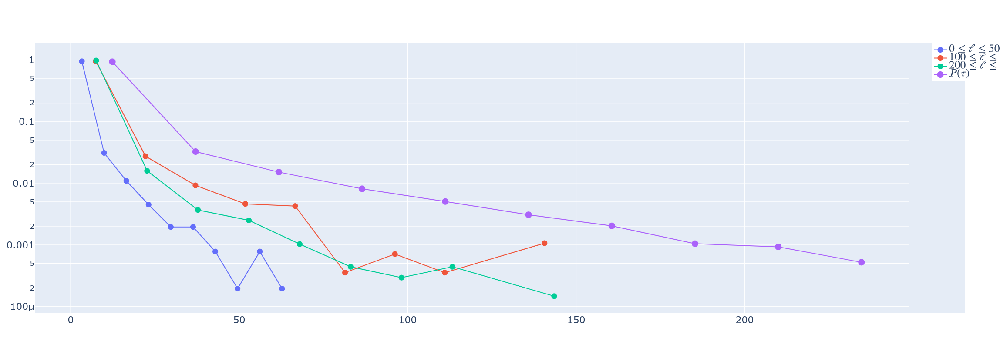

In [150]:
fig = go.Figure()

for i in range(3):
    fig.add_trace(go.Scatter(x=Ptauell['uk'][i][0]['label'], y=Ptauell['uk'][i][0]['pmf'], mode='lines+markers', name=fr"${limits[i][0]} \leq \ell \leq {limits[i][1]}$    ", marker_size = 13))
fig.add_trace(go.Scatter(x=Ptau['uk'][99][0]['label'], y=Ptau['uk'][99][0]['pmf'], mode='lines+markers', name=r'$P(\tau)$', marker_size=15))

fig.update_yaxes(type="log")
fig.update_layout(autosize=False, width=1300, height=800,
                 font={'size': 22},
                 legend_font_size = 40)

fig

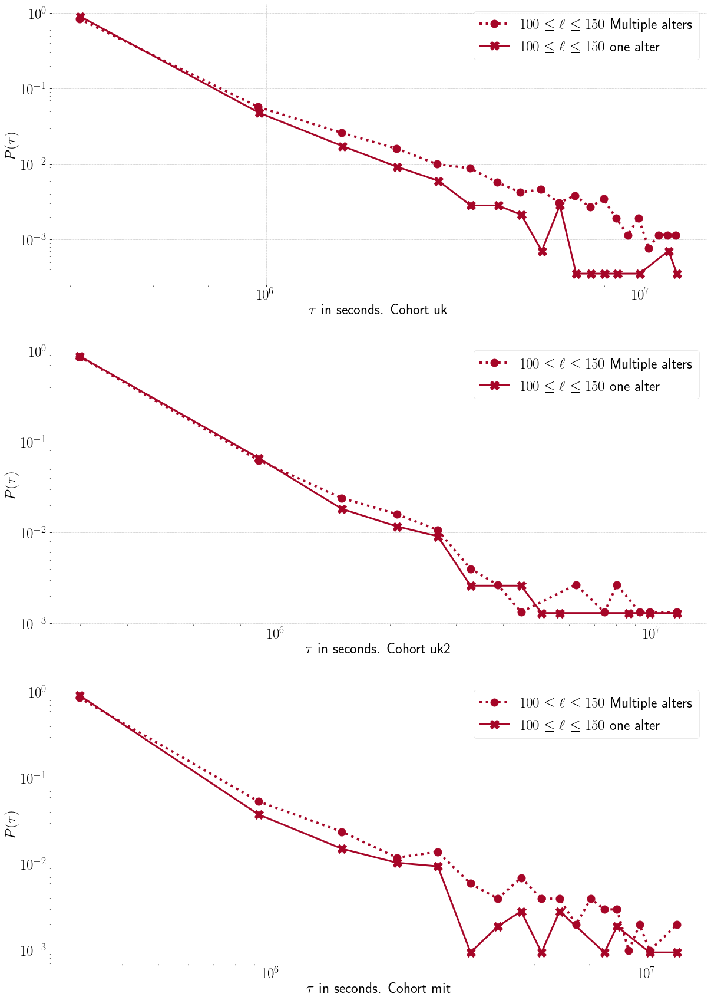

In [151]:
plt.figure(figsize=(20*1, 10*3))
p = 1

for c in ['uk', 'uk2', 'mit']:
#     plt.subplot(3,2,p)
#     plt.loglog()
#     plt.xlabel(fr'$\tau$ in days. Cohort {c}')
#     plt.ylabel(r"$P(\tau)$")
#     for i in range(3):
#         #plt.plot(Ptau[c][i][0]['label'], Ptau[c][i][0]['pmf'], marker="o", markersize=13, linestyle="solid", lw=4, c=colors[i], label=fr"${limits[i][0]} \leq \ell \leq {limits[i][1]}$ One alter")
#         plt.plot(Ptauell[c][i][0]['label'], Ptauell[c][i][0]['pmf'], marker="X", markersize=15, linestyle="dotted", lw=3, c=colors[i], label=fr"${limits[i][0]} \leq \ell \leq {limits[i][1]}$ Multiple alters")
#     plt.legend()
#     p += 1
    
    plt.subplot(3,1,p)
    plt.loglog()
    plt.xlabel(fr'$\tau$ in seconds. Cohort {c}')
    plt.ylabel(r"$P(\tau)$")
    for i in [1]:
        plt.plot(Ptau_bys[c][i][0]['label'], Ptau_bys[c][i][0]['pmf'], marker="o", markersize=13, linestyle="dotted", lw=4, c=colors[i], label=fr"${limits[i][0]} \leq \ell \leq {limits[i][1]}$ Multiple alters")
        plt.plot(Ptauell_bys[c][i][0]['label'], Ptauell_bys[c][i][0]['pmf'], marker="X", markersize=15, linestyle="solid", lw=3, c=colors[i], label=fr"${limits[i][0]} \leq \ell \leq {limits[i][1]}$ one alter")
    plt.legend()
    p += 1

In [173]:
sorted(Ptauell_bys['uk'][1][4])

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0,
 60.0

# From the beginning

To keep consistency, I will go back to the original unfiltered data sets with all phone calls. Then, for each cohort I will apply the following filters, image for reference

<center><img src="filters.png" style="width: 15%"/></center>

1. Remove all phone calls with duplicated time stamp. Actually, I will keep the first ocurrence and delete the rest. 
2. In the image, alter $x$ is excluded from the analysis because its lifetime exceeds $\ell_f$ for the long lifetime group
3. Even though $\ell_q = \ell_w$, alter $w$ is excluded because it ceased its activity in the interval delimited by the brown lines. 
4. Alter $z$ is excluded because it appread too late in the study.

## Remove duplicates

In [264]:
a = unfiltered['uk'].copy(deep=True)
a.head()

,ego,alter,time,uclock,aclock,rm
0,C07814508939,C0020165636994,2008-02-07 16:18:00,339,0,0.0
1,C07814508939,C0020165636994,2008-02-07 17:11:00,339,0,0.0
2,C07814508939,C0020165636994,2008-02-20 15:39:00,352,13,0.0
3,C07792658311,C0021213487966,2008-02-27 17:01:00,359,0,0.0
4,C07792658311,C0021213487966,2008-02-27 17:55:00,359,0,0.0


In [267]:
norep = {}
for c in ['uk', 'uk2', 'mit']:
    df = unfiltered[c].copy(deep=True)
    tmp = pd.DataFrame()
    counter = 0
    for ego in df['ego'].unique():
        df1 = df.loc[df['ego'] == ego]
        for alter in df1['alter'].unique():
            df2 = df1.loc[df1['alter'] == alter].sort_values(by='time')
            idx = list(df2.index)
            torm = []
            for i in range(1, len(idx)):
                if df2.at[idx[i], 'time'] == df2.at[idx[i - 1], 'time']:
                    torm.append(idx[i])
                    counter += 1
            df3 = df2.drop(torm)
            tmp = tmp.append(df3).reset_index(drop=True)
    norep[c] = tmp
    print(f'Cohort {c} removed {counter} calls')

Cohort uk removed 5488 calls
Cohort uk2 removed 1584 calls
Cohort mit removed 5315 calls


In [265]:
unfiltered.keys()

dict_keys(['mit', 'uk1', 'uk2', 'uk', 'all'])

# Global Time

In [153]:
globaltf = dt.datetime.now() - globalt0
print(f'This notebook took {globaltf}')
os.system(f"notify-send 'Notebook done' 'it took {globaltf}'")

This notebook took 0:27:20.775035


0